In [ ]:
from neo import io
import neo
import numpy as np
from pathlib import Path
import matplotlib.pylab as plt 
import seaborn as sns
import plotly.express as px
import pandas as pd
from pathlib import Path
from scipy.signal import convolve
from scipy.signal.windows import triang
from sklearn.decomposition import PCA
from scipy import stats
from utils import *

In [2]:
# useful for plotting
sns.set_theme(style="dark")
sns.set_context("notebook")
plt.style.use('ggplot')
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['legend.fontsize'] = 6

In [3]:
# loading the data
spike_rows = []

for file in Path("./").glob("*.nio"):
    print(f"Leggo: {file.name}")
    reader = neo.io.NixIO(filename=str(file), mode="ro")
    block = reader.read_block()

    for seg_idx, segment in enumerate(block.segments):
        for st_idx, spiketrain in enumerate(segment.spiketrains):
            spike_times = spiketrain.times.rescale("ms").magnitude
            senders = spiketrain.annotations.get("senders", None)
            device = spiketrain.annotations.get("device", "unknown")
            pop_size = spiketrain.annotations.get("pop_size", None)

            if senders and len(senders) == len(spike_times):
                for time, sender in zip(spike_times, senders):
                    spike_rows.append({
                        "time_ms": time,
                        "sender_id": sender,
                        "pop": device.split('_')[0],
                        "segment": seg_idx,
                        "file": file.name
                    })
            else:
                for time in spike_times:
                    spike_rows.append({
                        "time_ms": time,
                        "sender_id": f"unit{st_idx}",
                        "pop": device.split('_')[0],
                        "segment": seg_idx,
                        "file": file.name
                    })

df_spikes = pd.DataFrame(spike_rows)
print("Pops:", df_spikes['pop'].unique())

Leggo: f5d958d9-6c30-44be-8757-ebd3421a4600.nio
Leggo: 889130cd-c4c6-49d4-9d9c-58d54698c942.nio
Leggo: 8a2b111a-4a89-4c11-8de4-c016ef0e0984.nio
Leggo: 96e1e91c-1573-4c53-a434-e7b0ec8c0e01.nio
Leggo: 82b0c816-2904-44b9-9e62-bdebef72af84.nio
Leggo: db7b6d82-5fdf-4300-a42b-5259c8faf815.nio
Leggo: ae9d7dd5-d037-46db-a427-11e42709917e.nio
Leggo: c7dea197-26e5-46ac-afed-3dab340f79e3.nio
Pops: ['mossy' 'glomerulus' 'granule' 'golgi' 'purkinje' 'basket' 'stellate'
 'background']


In [4]:
df_spikes.head()

,time_ms,sender_id,pop,segment,file
0,31.3,97,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
1,35.0,41,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
2,48.6,113,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
3,65.3,17,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
4,69.5,9,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio


In [5]:
# maschera PC e id cells
df_analysis_pc = df_spikes[df_spikes['pop']=='purkinje'][['time_ms', 'sender_id']]
df_analysis_pc

,time_ms,sender_id
74802,7.6,32985
74803,8.5,32977
74804,8.9,32953
74805,9.0,32993
74806,9.2,32961
...,...,...
642702,4986.8,32967
642703,4990.9,32975
642704,4991.1,32951
642705,4992.6,33007


In [6]:
# maschera Basket e id cells
df_analysis_BK = df_spikes[df_spikes['pop']=='basket'][['time_ms', 'sender_id']]
df_analysis_BK

,time_ms,sender_id
76668,3.7,33089
76669,5.8,33057
76670,6.0,33017
76671,23.2,33097
76672,23.5,33025
...,...,...
644120,4987.1,33023
644121,4987.2,33143
644122,4988.5,33087
644123,4989.3,33159


In [7]:
num_neurons_PC = df_spikes[df_spikes['pop']=='purkinje'][['time_ms', 'sender_id']]['sender_id'].unique().shape
print("Number of neurons Purkinje:", num_neurons_PC)

Number of neurons Purkinje: (68,)


In [8]:
num_neurons_BK = df_spikes[df_spikes['pop']=='basket'][['time_ms', 'sender_id']]['sender_id'].unique().shape
print("Number of neurons basket:", num_neurons_BK)

Number of neurons basket: (150,)


In [9]:
# dataframe -> numpy array
purkinje_spikes = np.array(df_analysis_pc)
print("Shape:", purkinje_spikes.shape) # first column is time, second is cell id
print(purkinje_spikes)

# dataframe -> numpy array
basket_spikes = np.array(df_analysis_BK)
print("Shape:", basket_spikes.shape) # first column is time, second is cell id
print(basket_spikes)

Shape: (15825, 2)
[[7.6000e+00 3.2985e+04]
 [8.5000e+00 3.2977e+04]
 [8.9000e+00 3.2953e+04]
 ...
 [4.9911e+03 3.2951e+04]
 [4.9926e+03 3.3007e+04]
 [4.9990e+03 3.2959e+04]]
Shape: (12508, 2)
[[3.7000e+00 3.3089e+04]
 [5.8000e+00 3.3057e+04]
 [6.0000e+00 3.3017e+04]
 ...
 [4.9885e+03 3.3087e+04]
 [4.9893e+03 3.3159e+04]
 [4.9917e+03 3.3079e+04]]


Shape: (15825, 2)
[[7.6000e+00 3.2985e+04]
 [8.5000e+00 3.2977e+04]
 [8.9000e+00 3.2953e+04]
 ...
 [4.9911e+03 3.2951e+04]
 [4.9926e+03 3.3007e+04]
 [4.9990e+03 3.2959e+04]]
Computing firing rates of purkinje
Number of neurons: 68
Time vector: 0 5000.0
Number of bins: 1000
Kernel size: 8
Neuron ID: 32946.0
First few spikes: [ 9.7 26.3 51.4 75.2 97.2]
Neuron ID: 32947.0
First few spikes: [ 8.8 26.  49.9 72.9 90.1]
Neuron ID: 32948.0
First few spikes: [ 9.3 24.6 48.2 69.6 90.6]
Rates array shape: (68, 1000)
Rates array first few values: [[31.25 43.75 50.   ... 37.5  43.75 43.75]
 [31.25 43.75 50.   ... 50.   50.   50.  ]
 [31.25 50.   62.5  ... 37.5  43.75 43.75]
 [31.25 43.75 50.   ... 50.   50.   43.75]
 [31.25 43.75 50.   ... 43.75 43.75 31.25]]
Rates array first few neurons: [[31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 50.   62.5  62.5  62.5 ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 50.   

/home/nix/Uni/3Year/Thesis/testStefania/testStefania/utils.py:234: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


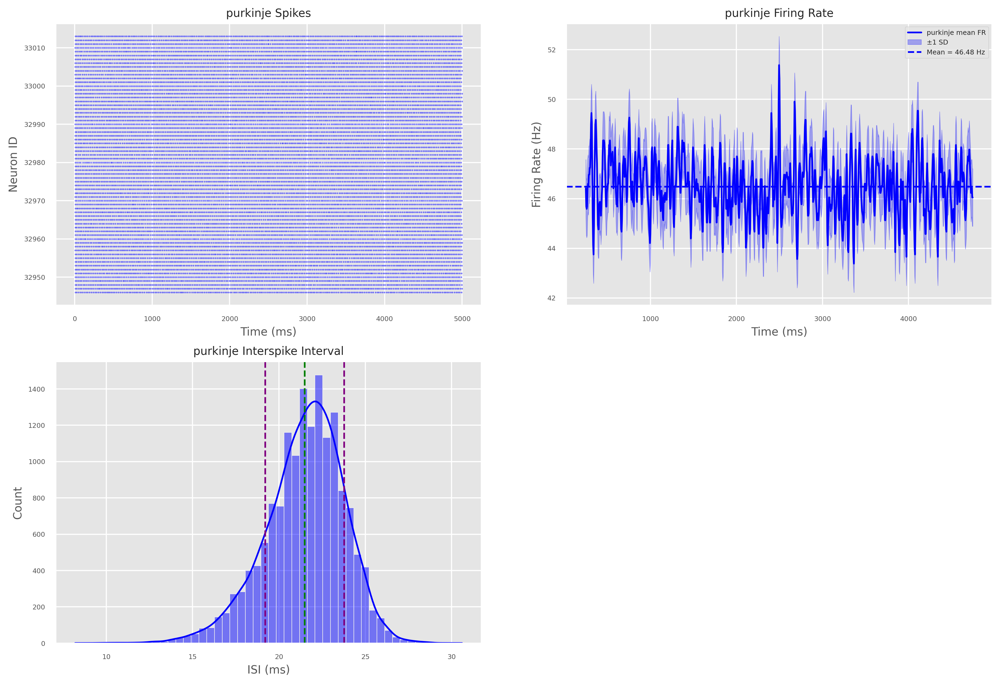

In [10]:
times_vectorPC, mean_ratePC, rates_per_neuronPC, stats_popPC, isi_dictPC, stats_dictPC = process_pop(df_spikes, "purkinje", color="blue", mask_flag=True, dt=5, sigma=20)

Shape: (12508, 2)
[[3.7000e+00 3.3089e+04]
 [5.8000e+00 3.3057e+04]
 [6.0000e+00 3.3017e+04]
 ...
 [4.9885e+03 3.3087e+04]
 [4.9893e+03 3.3159e+04]
 [4.9917e+03 3.3079e+04]]
Computing firing rates of basket
Number of neurons: 150
Time vector: 0 4999.2
Number of bins: 1000
Kernel size: 12
Neuron ID: 33014.0
First few spikes: [ 23.2  71.5 112.  166.7 243.2]
Neuron ID: 33015.0
First few spikes: [ 23.4 112.  241.9 271.9 398.4]
Neuron ID: 33016.0
First few spikes: [ 23.4  69.6 115.7 166.8 275. ]
Rates array shape: (150, 1000)
Rates array first few values: [[ 8.33333333 13.88888889 19.44444444 ...  0.          0.
   0.        ]
 [ 8.33333333 13.88888889 19.44444444 ...  0.          0.
   0.        ]
 [ 8.33333333 13.88888889 19.44444444 ... 25.         30.55555556
  30.55555556]
 [33.33333333 44.44444444 50.         ...  0.          0.
   0.        ]
 [ 8.33333333 13.88888889 19.44444444 ...  0.          0.
   0.        ]]
Rates array first few neurons: [[ 8.33333333 13.88888889 19.44444444 

/home/nix/Uni/3Year/Thesis/testStefania/testStefania/utils.py:234: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


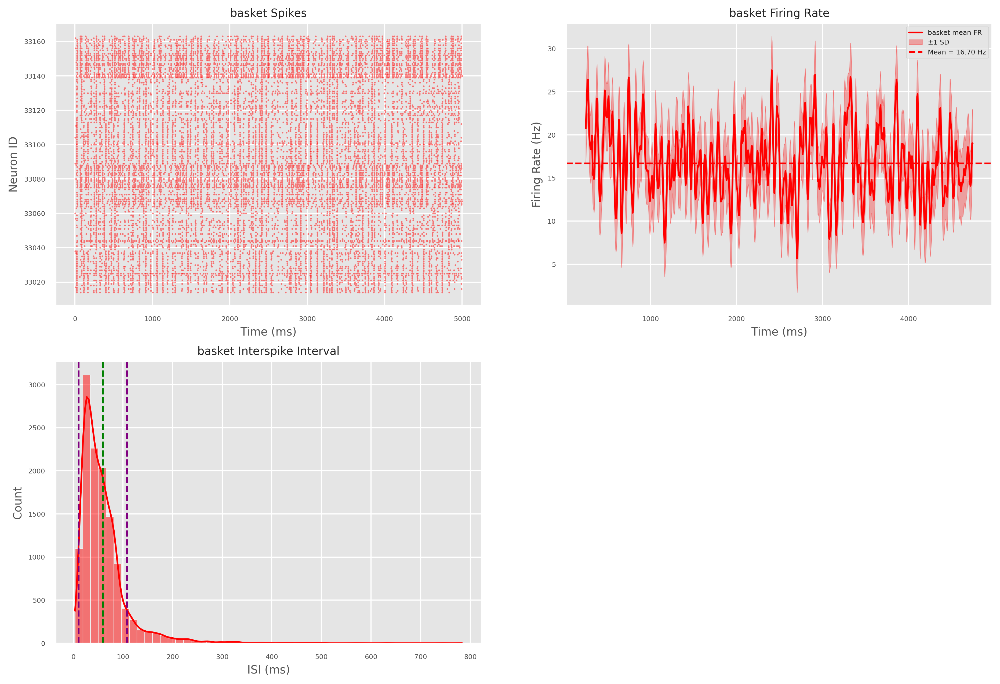

In [11]:
times_vectorBK, mean_rateBK, rates_per_neuronBK, stats_popBK, isi_dictBK, stats_dictBK = process_pop(df_spikes, "basket", color="red", mask_flag=True, dt=5, sigma=30)

# More Spectral Analysis Using FOOF
The FOOOF object fits models to power spectra. The module itself does not compute power spectra. Computing power spectra needs to be done prior to using the FOOOF module. Thus I need to first compute the spectrum using Welch

Welch’s method computes an estimate of the power spectral density by dividing the data into overlapping segments, computing a modified periodogram for each segment and averaging the periodograms

In [12]:
from scipy.signal import welch

def compute_power_spectrum(rates_array, dt=0.1, nperseg=512):
    """
    Compute power spectrum using Welch's method.
    
    Args:
        rates_array: 2D numpy array of shape (n_neurons, n_time_bins)
        dt: time step in ms (from your firing rate computation)
        nperseg: length of each segment for Welch's method

    Returns:
        freqs: frequencies corresponding to the power spectrum (in Hz)
        psd: power spectral density values
    """
    dt_s = dt / 1000.0
    fs =  1 / dt_s  
    print(fs)
    
    psd = []
    
    for neuron_rates in rates_array:
        f, p = welch(neuron_rates, fs=fs, nperseg=nperseg, detrend='constant')
        psd.append(p)

    freqs = np.array(f)
    freqs = freqs[1:]
    psd = np.array(psd)[:, 1:]
    print(f"Computed power spectrum for {rates_array.shape[0]} neurons with {len(freqs)} frequency bins.")
    
    
    return freqs, psd

def plot_power_spectrum(freqs, psd, pop, n_neurons_to_plot=8):
    """
    Plot power spectrum for a given population.
    
    Args:
        freqs: frequencies corresponding to the power spectrum
        psd: power spectral density values (shape: n_neurons x n_freqs)
        pop: name of the population
        n_neurons_to_plot: number of neurons to plot
    """
    plt.figure(figsize=(12, 6))
    for i in range(n_neurons_to_plot):
        plt.plot(freqs, psd[i], label=f'Neuron {i}', alpha=0.5)
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density')
    plt.title(f'Power Spectrum for {pop}')
    plt.axvline(x=46, color='k', linestyle='--', alpha=0.3)
    plt.axvline(x=46*2, color='k', linestyle='--', alpha=0.3)
    plt.axvline(x=46*3, color='k', linestyle='--', alpha=0.3)
    plt.xscale('log')
    # plt.yscale('log')
    # plt.xlim(0, 100) 
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [13]:
rates_per_neuronPC.shape, rates_per_neuronBK.shape

((68, 900), (150, 900))

10000.0
Computed power spectrum for 68 neurons with 450 frequency bins.
Frequency range: 11.11 - 5000.00 Hz
PSD shape: (68, 450)


/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 1024 is greater than input length  = 900, using nperseg = 900
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,


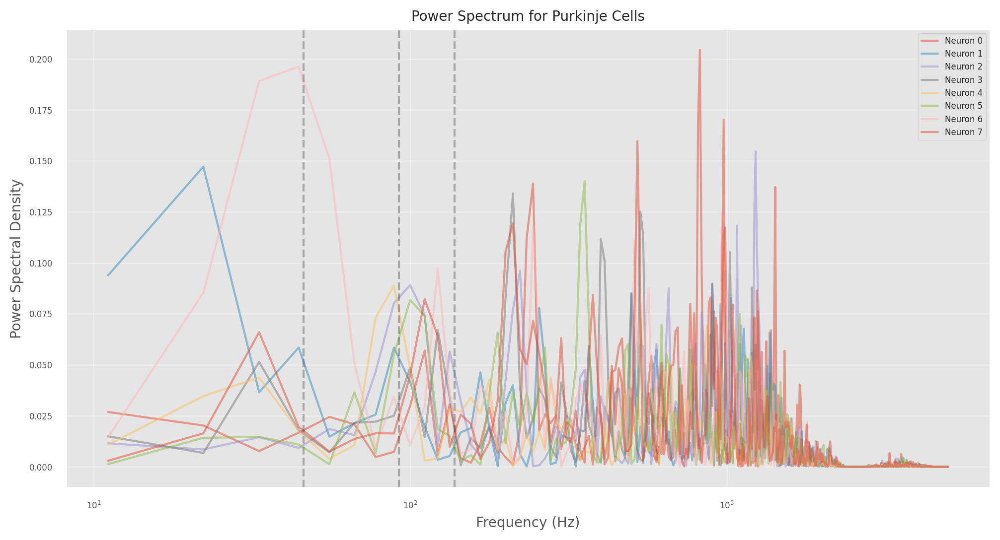

In [14]:
freqs_pc, psd_pc = compute_power_spectrum(rates_per_neuronPC, dt=0.1, nperseg=1024)

print(f"Frequency range: {freqs_pc[0]:.2f} - {freqs_pc[-1]:.2f} Hz")
print(f"PSD shape: {psd_pc.shape}")
plot_power_spectrum(freqs_pc, psd_pc, 'Purkinje Cells', n_neurons_to_plot=8)

10000.0
Computed power spectrum for 150 neurons with 450 frequency bins.
Frequency range: 11.11 - 5000.00 Hz
PSD shape: (150, 450)


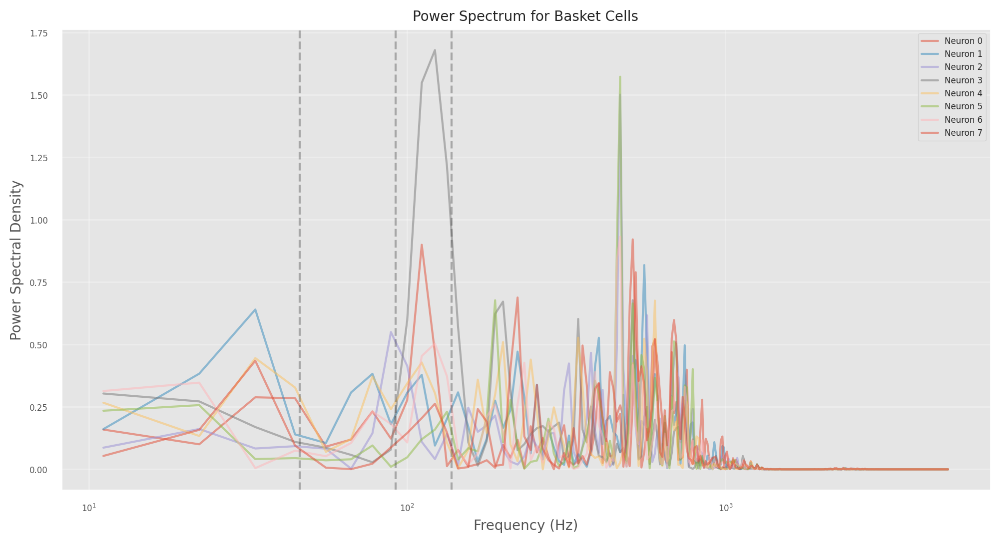

In [15]:
freqs_bk, psd_bk = compute_power_spectrum(rates_per_neuronBK, dt=0.1, nperseg=1024)
print(f"Frequency range: {freqs_bk[0]:.2f} - {freqs_bk[-1]:.2f} Hz")
print(f"PSD shape: {psd_bk.shape}")
plot_power_spectrum(freqs_bk, psd_bk, 'Basket Cells', n_neurons_to_plot=8)

In [16]:
# Check for zero frequencies in the power spectrum
# This is to ensure that the power spectrum is computed correctly and does not contain any zero frequencies

np.sum(freqs_pc == 0.0)

np.int64(0)

In [17]:
def plot_log_psd(freqs, psd, n_plot=4):
    fig , axs = plt.subplots(1, n_plot, figsize=(10, 5), dpi=300)
    for i in range(n_plot):
        axs[i].plot(freqs, np.log10(psd[i]), label=f'Neuron {i}', alpha=0.5)
        axs[i].set_title(f'Neuron {i}')
        axs[i].set_xlabel('Frequency (Hz)')
        axs[i].set_ylabel('Log Power Spectral Density')
        axs[i].grid(True, alpha=0.3)
        axs[i].legend()
    plt.tight_layout()
    plt.show()

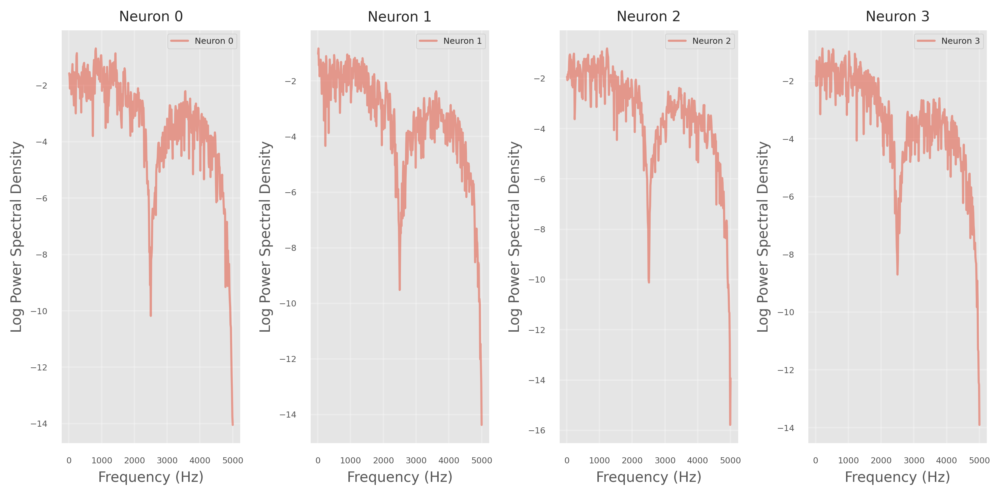

In [18]:
plot_log_psd(freqs_pc, psd_pc, n_plot=4)

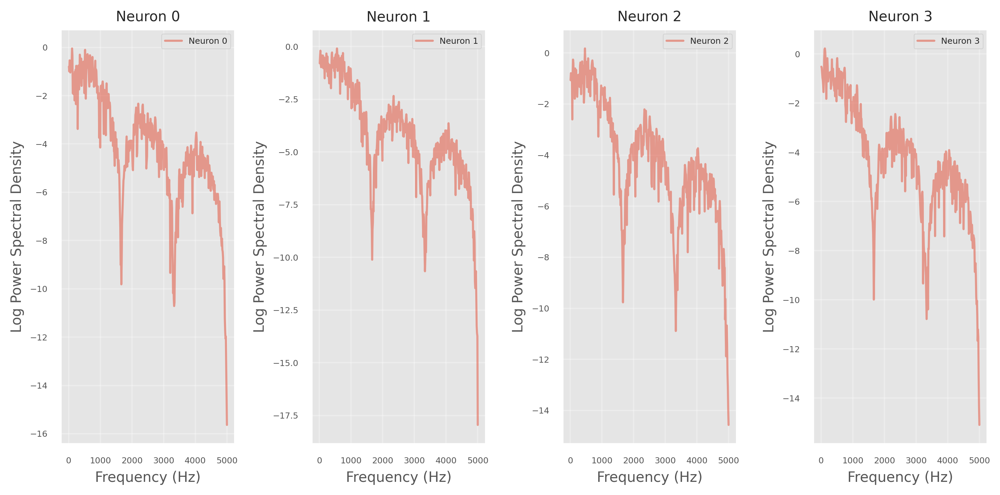

In [19]:
plot_log_psd(freqs_bk, psd_bk, n_plot=4)

In [20]:
psd_pc.shape, freqs_pc.shape

((68, 450), (450,))

In [21]:
# veryfying the frequency range and shape of the power spectrum
print(f"Shape of psd_pc: {psd_pc.shape}")
print(f"minimum of freqs_pc: {freqs_pc[0]:.2f} Hz")
print(f"maximum of freqs_pc: {freqs_pc[-1]:.2f} Hz\n")

print(f"Shape of psd_bk: {psd_bk.shape}")
print(f"minimum of freqs_bk: {freqs_bk[0]:.2f} Hz")
print(f"maximum of freqs_bk: {freqs_bk[-1]:.2f} Hz")
print(f"Shape of psd_bk: {psd_bk.shape}")



Shape of psd_pc: (68, 450)
minimum of freqs_pc: 11.11 Hz
maximum of freqs_pc: 5000.00 Hz

Shape of psd_bk: (150, 450)
minimum of freqs_bk: 11.11 Hz
maximum of freqs_bk: 5000.00 Hz
Shape of psd_bk: (150, 450)


In [22]:
def psd_mask(freqs, psd, range_mask):
    """
    Mask the power spectral density based on the frequency mask.
    
    Args:
        freqs: frequencies corresponding to the power spectrum
        psd: power spectral density values (shape: n_neurons x n_freqs)

    Returns:
        masked_psd: masked power spectral density
    """
    print(f"Frequencies spacing in psd: {freqs[1] - freqs[0]:.2f} Hz")
    
    freqs_mask = (freqs >= range_mask[0]) & (freqs <= range_mask[1])

    print(f"number of frequencies in the range {range_mask[0]}-{range_mask[1]} Hz: {np.sum(freqs_mask)}")
    extracted_freqs = freqs[freqs_mask]
    print(f"Extracted frequencies in the range: {extracted_freqs}")

    col_names = [f"{freq:.2f}Hz" for freq in extracted_freqs]

    psd_masked = pd.DataFrame(psd[:, freqs_mask], columns=col_names)
    print(f"Shape of psd_masked: {psd_masked.shape}")

    return psd_masked

    

In [23]:
range_mask_pc = (20, 70)  # Hz
range_mask_bk = (20, 60)  # Hz


psd_pc_masked = psd_mask(freqs_pc, psd_pc, range_mask_pc)
psd_bk_masked = psd_mask(freqs_bk, psd_bk, range_mask_bk)

Frequencies spacing in psd: 11.11 Hz
number of frequencies in the range 20-70 Hz: 5
Extracted frequencies in the range: [22.22222222 33.33333333 44.44444444 55.55555556 66.66666667]
Shape of psd_masked: (68, 5)
Frequencies spacing in psd: 11.11 Hz
number of frequencies in the range 20-60 Hz: 4
Extracted frequencies in the range: [22.22222222 33.33333333 44.44444444 55.55555556]
Shape of psd_masked: (150, 4)


In [24]:
psd_pc_energy = np.trapezoid(psd_pc_masked.values, dx=freqs_pc[1] - freqs_pc[0], axis=1)
psd_pc_energy = pd.DataFrame(psd_pc_energy, columns=['Energy'])

psd_bk_energy = np.trapezoid(psd_bk_masked.values, dx=freqs_bk[1] - freqs_bk[0], axis=1)
psd_bk_energy = pd.DataFrame(psd_bk_energy, columns=['Energy'])

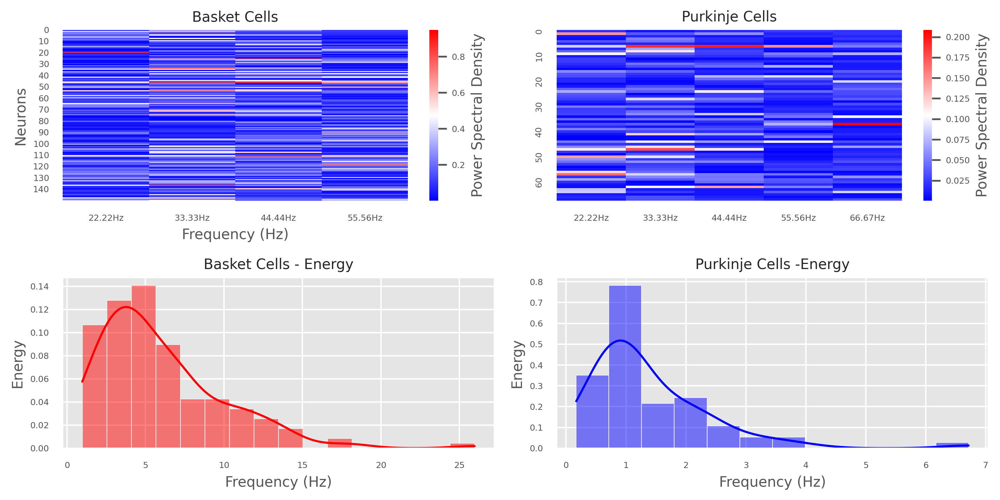

In [25]:
fig, ax = plt.subplots(2, 2, figsize=(10, 5), dpi=300)

sns.heatmap(psd_bk_masked, cmap='bwr', cbar_kws={'label': 'Power Spectral Density'}, yticklabels=10, ax=ax[0,0])
ax[0,0].set_title('Basket Cells')
ax[0,0].set_xlabel('Frequency (Hz)')
ax[0,0].set_ylabel('Neurons')

ax[0,1].set_title('Purkinje Cells')
ax[0,1].set_xlabel('Frequency (Hz)')
ax[0,1].set_ylabel('Neurons')
sns.heatmap(psd_pc_masked, cmap='bwr', cbar_kws={'label': 'Power Spectral Density'}, yticklabels=10, ax=ax[0,1])

ax[1,0].set_title('Basket Cells - Energy')
ax[1,0].set_xlabel('Frequency (Hz)')
ax[1,0].set_ylabel('Energy')
sns.histplot(psd_bk_energy['Energy'], kde=True, stat="density", color="red", label="Basket Cells", ax=ax[1,0])

ax[1,1].set_title('Purkinje Cells -Energy')
ax[1,1].set_xlabel('Frequency (Hz)')
ax[1,1].set_ylabel('Energy')
sns.histplot(psd_pc_energy['Energy'], kde=True, stat="density", color="blue", label="Purkinje Cells", ax=ax[1,1])

plt.tight_layout()

Silhouette Score for 2 clusters: 0.6523
Stats:
Mean sum of PSD by cluster:
     Energy
0  1.067351
1  3.289442
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67]
Number of neurons in each cluster: [58 10]
Unique clusters: [0 1]


/tmp/ipykernel_28546/3159251611.py:62: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = ax[1].boxplot([ONgamma, OFFgamma], labels=['ON', 'OFF'], patch_artist=True)


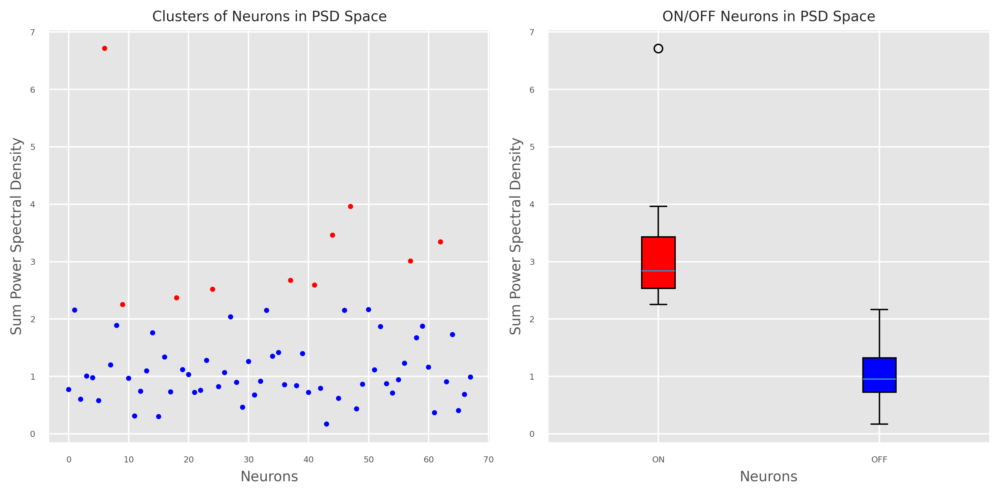

In [26]:
# clustering in the psd space to find the on/off states WHEN STIMULUS
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def cluster_psd(psd_sum, n_clusters=2, plot=True):
    """
    Cluster the power spectral density data using KMeans.
    
    Args:
        psd_masked: masked power spectral density DataFrame
        n_clusters: number of clusters to form

    Returns:
        labels: cluster labels for each neuron
    """
    kmeans = KMeans(n_clusters=n_clusters, random_state=1)
    clusters = kmeans.fit_predict(psd_sum)

    silhouette = silhouette_score(psd_sum, clusters)
    print(f"Silhouette Score for {n_clusters} clusters: {silhouette:.4f}")

    if plot:
        plot_clusters(psd_sum, clusters)

    neuronsON = np.where(clusters == 1)[0]
    neuronsOFF = np.where(clusters == 0)[0]
    
    return clusters, neuronsON, neuronsOFF

def plot_clusters(psd_sum, clusters):
    """
    Plot the clustered power spectral density data.
    
    Args:
        psd_masked: masked power spectral density DataFrame
        clusters: cluster labels for each neuron
    """
    print("Stats:")
    print(f"Mean sum of PSD by cluster:")
    print(psd_sum.groupby(clusters).mean())
    neurons_idx = np.arange(psd_sum.shape[0])
    print(neurons_idx)
    print(f"Number of neurons in each cluster: {np.bincount(clusters)}")
    print(f"Unique clusters: {np.unique(clusters)}")

    gamma_values = psd_sum['Energy'].values
    colors = ['blue' if c == 0 else 'red' for c in clusters]

    fig , ax = plt.subplots(1, 2, figsize=(10, 5), dpi=300)
    ax[0].scatter(neurons_idx, gamma_values, c=colors, s=10)
    ax[0].set_title('Clusters of Neurons in PSD Space')
    ax[0].set_xlabel('Neurons')
    ax[0].set_ylabel('Sum Power Spectral Density')

    neuronsOFF = np.where(clusters == 0)[0]
    neuronsON = np.where(clusters == 1)[0]

    ONgamma = psd_sum.loc[neuronsON, 'Energy'].values
    OFFgamma = psd_sum.loc[neuronsOFF, 'Energy'].values

    colors = ['red', 'blue']
    bplot = ax[1].boxplot([ONgamma, OFFgamma], labels=['ON', 'OFF'], patch_artist=True)
    ax[1].set_title('ON/OFF Neurons in PSD Space')
    ax[1].set_xlabel('Neurons')
    ax[1].set_ylabel('Sum Power Spectral Density')
    ax[1].set_xticklabels(['ON', 'OFF'])
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)
    
    plt.tight_layout()
    plt.show()


clusters_pc, neuronsON, neuronsOFF = cluster_psd(psd_pc_energy, n_clusters=2)

In [27]:
%store neuronsON
%store neuronsOFF

Stored 'neuronsON' (ndarray)
Stored 'neuronsOFF' (ndarray)


Shape of mean_rate: (68, 1)
Silhouette Score for 2 clusters: 0.5371
Stats:
Mean sum of PSD by cluster:
   Mean Rate
0  47.347222
1  45.607026
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67]
Number of neurons in each cluster: [34 34]
Unique clusters: [0 1]


/tmp/ipykernel_28546/760987230.py:65: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = ax[1].boxplot([ONgamma, OFFgamma], labels=['ON', 'OFF'], patch_artist=True)


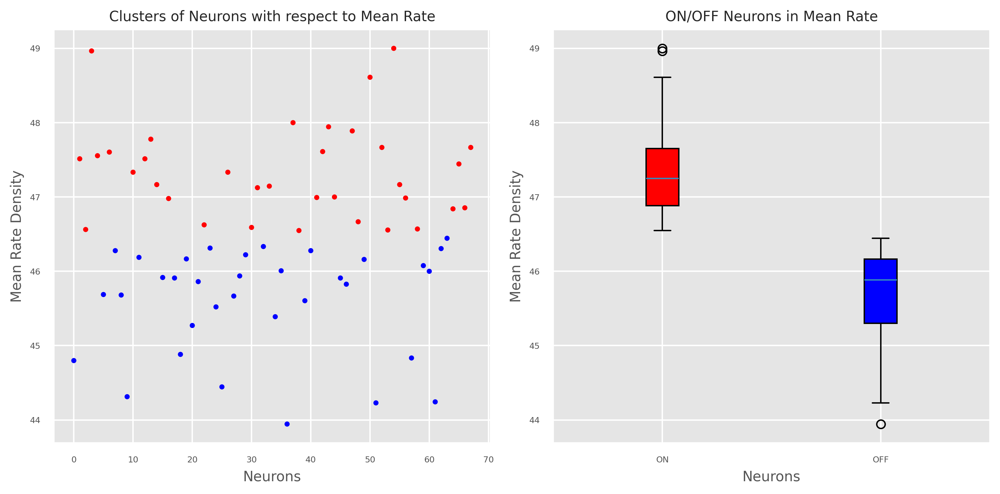

In [28]:
# clustering in the psd space to find the on/off states
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def cluster_fr(firing_rates_per_neuron, n_clusters=2, plot=True):
    """
    Cluster the power spectral density data using KMeans.
    
    Args:
        psd_masked: masked power spectral density DataFrame
        n_clusters: number of clusters to form

    Returns:
        labels: cluster labels for each neuron
    """
    mean_rate = firing_rates_per_neuron.mean(axis=1)
    mean_rate = pd.DataFrame(mean_rate, columns=['Mean Rate'])
    print(f"Shape of mean_rate: {mean_rate.shape}")
    kmeans = KMeans(n_clusters=n_clusters, random_state=1)
    clusters = kmeans.fit_predict(mean_rate)

    silhouette = silhouette_score(mean_rate, clusters)
    print(f"Silhouette Score for {n_clusters} clusters: {silhouette:.4f}")

    if plot:
        plot_clusters(mean_rate, clusters)

    neuronsON = np.where(clusters == 0)[0]
    neuronsOFF = np.where(clusters == 1)[0]
    
    return clusters, neuronsON, neuronsOFF

def plot_clusters(mean_rate, clusters):
    """
    Plot the clustered power spectral density data.
    
    Args:
        psd_masked: masked power spectral density DataFrame
        clusters: cluster labels for each neuron
    """
    print("Stats:")
    print(f"Mean sum of PSD by cluster:")
    print(mean_rate.groupby(clusters).mean())
    neurons_idx = np.arange(mean_rate.shape[0])
    print(neurons_idx)
    print(f"Number of neurons in each cluster: {np.bincount(clusters)}")
    print(f"Unique clusters: {np.unique(clusters)}")

    gamma_values = mean_rate['Mean Rate'].values
    colors = ['blue' if c == 1 else 'red' for c in clusters]

    fig , ax = plt.subplots(1, 2, figsize=(10, 5), dpi=300)
    ax[0].scatter(neurons_idx, gamma_values, c=colors, s=10)
    ax[0].set_title('Clusters of Neurons with respect to Mean Rate')
    ax[0].set_xlabel('Neurons')
    ax[0].set_ylabel('Mean Rate Density')

    neuronsOFF = np.where(clusters == 1)[0]
    neuronsON = np.where(clusters == 0)[0]

    ONgamma = mean_rate.loc[neuronsON, 'Mean Rate'].values
    OFFgamma = mean_rate.loc[neuronsOFF, 'Mean Rate'].values

    colors = ['red', 'blue']
    bplot = ax[1].boxplot([ONgamma, OFFgamma], labels=['ON', 'OFF'], patch_artist=True)
    ax[1].set_title('ON/OFF Neurons in Mean Rate')
    ax[1].set_xlabel('Neurons')
    ax[1].set_ylabel('Mean Rate Density')
    ax[1].set_xticklabels(['ON', 'OFF'])
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)
    
    plt.tight_layout()
    plt.show()


clusters_pcFR, neuronsON_fr, neuronsOFF_fr = cluster_fr(rates_per_neuronPC, n_clusters=2)

In [29]:
%store neuronsON_fr
%store neuronsOFF_fr

Stored 'neuronsON_fr' (ndarray)
Stored 'neuronsOFF_fr' (ndarray)


In [30]:
neuronsON.shape

(10,)

   Frequency Label
0  47.513889    ON
1  46.562500    ON
2  48.965278    ON
3  47.555556    ON
4  47.604167    ON


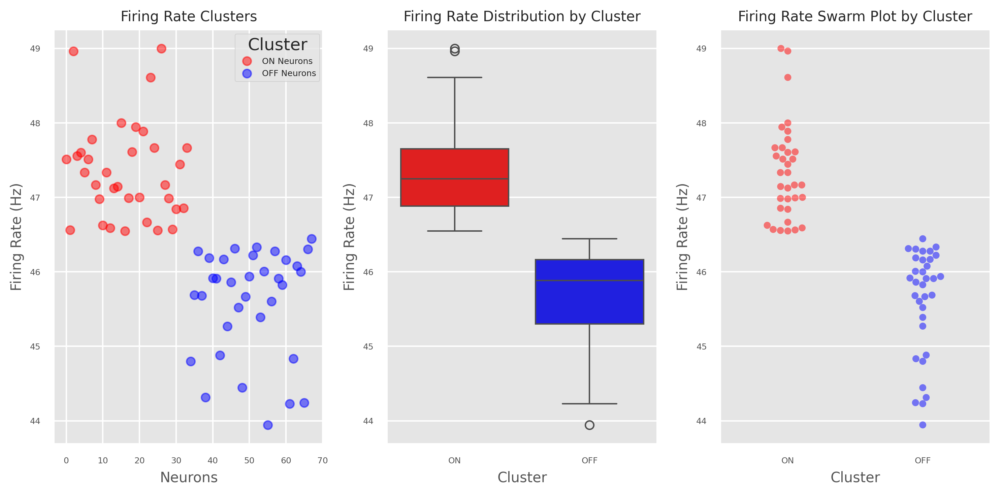

In [31]:
# validazione con i firing rates

def plot_fr_clusters(rates_per_neuron, clusters):
    neuronsOFF = np.where(clusters == 1)[0]
    neuronsON  = np.where(clusters == 0)[0]

    fr_mean = rates_per_neuron.mean(axis=1)
    fr_mean_OFF = fr_mean[neuronsOFF]
    fr_mean_ON = fr_mean[neuronsON]

    fr_total = np.concatenate([fr_mean_ON, fr_mean_OFF])
    label_ON = ['ON' for i in range(len(fr_mean_ON))]
    label_OFF = ['OFF' for i in range(len(fr_mean_OFF))]
    labels = label_ON + label_OFF
    
    # CORREZIONE: Creare il DataFrame correttamente
    data = pd.DataFrame({
        'Frequency': fr_total,  # Mantiene i valori numerici
        'Label': labels         # Stringhe separate
    })
    # data = data.sort_values(by='Frequency', ascending=True)

    print(data.head())
    fig, axs = plt.subplots(1, 3, figsize=(10, 5), dpi=300)
    colors = ['red', 'blue']
    
    axs[0].plot(data.query("Label == 'ON'")['Frequency'], 'o', color='red', label='ON Neurons', alpha=0.5)
    axs[0].plot(data.query("Label == 'OFF'")['Frequency'], 'o', color='blue', label='OFF Neurons', alpha=0.5)
    axs[0].set_title('Firing Rate Clusters')
    axs[0].set_xlabel('Neurons')
    axs[0].set_ylabel('Firing Rate (Hz)')
    axs[0].legend(title='Cluster', loc='upper right')
    
    sns.boxplot(data=data, x='Label', y='Frequency', hue='Label', palette=colors, ax=axs[1])
    axs[1].set_title('Firing Rate Distribution by Cluster')
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Firing Rate (Hz)')
    
    sns.swarmplot(data=data, x='Label', y='Frequency', hue='Label', palette=colors, ax=axs[2], alpha=0.5)
    axs[2].set_title('Firing Rate Swarm Plot by Cluster')
    axs[2].set_xlabel('Cluster')
    axs[2].set_ylabel('Firing Rate (Hz)')
    
    plt.tight_layout()
    plt.show()

plot_fr_clusters(rates_per_neuronPC, clusters_pcFR)

In [32]:
# relating Basket Cells to Purkinje Cells activity for ON and OFF states

def relate_basket_to_pc(basket_rates, purkinje_rates, clusters=None, num_neurons_BK=num_neurons_BK):
    """
    Relate Basket Cells activity to Purkinje Cells activity based on clusters.
    
    Args:
        basket_spikes: numpy array of Basket Cells spikes
        purkinje_spikes: numpy array of Purkinje Cells spikes
        clusters: cluster labels for each Purkinje neuron

    Returns:
        None
    """
    centered_ratesPC = purkinje_rates - np.mean(purkinje_rates, axis=1, keepdims=True)
    centered_ratesBK = basket_rates - np.mean(basket_rates, axis=1, keepdims=True)
    

    if clusters is not None:
        neuronsOFF = np.where(clusters == 0)[0]
        neuronsON  = np.where(clusters == 1)[0]
        rates_neuron_ON = centered_ratesPC[neuronsON]
        rates_neuron_OFF = centered_ratesPC[neuronsOFF]
        corr_matrixON = np.zeros((num_neurons_BK[0], neuronsON.shape[0]))
        corr_matrixOFF = np.zeros((num_neurons_BK[0], neuronsOFF.shape[0]))

        for i in range(num_neurons_BK[0]):
            for j in range(neuronsON.shape[0]):
                corr_matrixON[i, j] = np.corrcoef(centered_ratesBK[i], rates_neuron_ON[j])[0, 1]
            for j in range(neuronsOFF.shape[0]):
                corr_matrixOFF[i, j] = np.corrcoef(centered_ratesBK[i], rates_neuron_OFF[j])[0, 1]

        print(f"Shape of correlation matrix ON: {corr_matrixON.shape}")
        print(f"Shape of correlation matrix OFF: {corr_matrixOFF.shape}")

        corr_matrix = np.concat((corr_matrixON, corr_matrixOFF), axis=1) 
        neurons_boundary = neuronsON.shape[0]
        print(f"Shape of combined correlation matrix: {corr_matrix.shape}")
    else:
        corr_matrix = np.zeros((num_neurons_BK[0], purkinje_rates.shape[0]))
        for i in range(num_neurons_BK[0]):
            for j in range(purkinje_rates.shape[0]):
                corr_matrix[i, j] = np.corrcoef(centered_ratesBK[i], centered_ratesPC[j])[0, 1]
        neurons_boundary = purkinje_rates.shape[0]
        neuronsOFF = np.array([neuron for neuron in range(purkinje_rates.shape[0])])
        neuronsON = np.array([])

    # plot_corr(corr_matrix, title='Correlation Matrix', neurons_boundary=neurons_boundary, neuronsOFF=neuronsOFF, neuronsON=neuronsON)

    return corr_matrix, neurons_boundary, neuronsOFF, neuronsON

def compute_pvalue(corr_matrix):
    basket_neurons = corr_matrix.shape[0]
    purkinje_neurons = corr_matrix.shape[1]
    dof = 900

    p_values = np.zeros((basket_neurons, purkinje_neurons))
    for i in range(basket_neurons):
        for j in range(purkinje_neurons):
            r = corr_matrix[i, j]
            t_stat = r * np.sqrt((dof - 2) / (1 - r**2))
            p_value = 2 * (1 - stats.t.cdf(np.abs(t_stat), df=dof - 2))
            p_values[i, j] = p_value
    
    return p_values
    

def plot_corr(corr_matrix, title, neurons_boundary, neuronsOFF, neuronsON):
    """
    Plot the correlation matrix.
    
    Args:
        corr_matrix: correlation matrix to plot
        title: title of the plot
        num_neurons_BK: number of Basket Cells neurons
    """
    x_labels = neuronsON.tolist() + neuronsOFF.tolist()
    print(f"X labels: {x_labels}")
    plt.figure(figsize=(10, 5), dpi=300)
    sns.heatmap(corr_matrix, cmap='bwr', annot=False, cbar_kws={'label': 'Correlation Coefficient'})
    plt.title(title)
    plt.xlabel('Purkinje Neurons')
    plt.ylabel('Basket Neurons')
    plt.axvline(x=neurons_boundary, color='k', linestyle='--', alpha=0.3)
    plt.xticks(ticks=[label for label in range(len(x_labels))], labels=x_labels)
    plt.tight_layout()
    plt.show()
    

corr_matrixBKPC, neurons_bound, neuronsON, neuronsOFF = relate_basket_to_pc(rates_per_neuronBK, rates_per_neuronPC)

In [33]:
def compute_pvalue(corr_matrix):
    basket_neurons = corr_matrix.shape[0]
    purkinje_neurons = corr_matrix.shape[1]
    dof = 900

    p_values = np.zeros((basket_neurons, purkinje_neurons))
    for i in range(basket_neurons):
        for j in range(purkinje_neurons):
            r = corr_matrix[i, j]
            t_stat = r * np.sqrt((dof - 2) / (1 - r**2))
            p_value = 2 * (1 - stats.t.cdf(np.abs(t_stat), df=dof - 2))
            p_values[i, j] = p_value
    
    return p_values
p_valuesPC = compute_pvalue(corr_matrixBKPC)
p_valuesPC

array([[3.07159192e-02, 7.24395718e-03, 1.30437796e-01, ...,
        1.06533389e-01, 7.53758136e-05, 3.35674561e-06],
       [1.55978954e-01, 1.81481791e-01, 2.96670779e-01, ...,
        7.65787991e-02, 8.99184264e-06, 1.32685483e-03],
       [3.71127021e-01, 2.00051585e-03, 6.37716686e-02, ...,
        2.88265707e-03, 7.01120263e-01, 2.15649327e-06],
       ...,
       [1.91454671e-02, 1.30075308e-01, 5.12098840e-01, ...,
        2.52091888e-07, 1.00661701e-11, 0.00000000e+00],
       [9.98451456e-01, 3.13474979e-01, 2.72979849e-01, ...,
        1.41247615e-02, 4.02982110e-03, 1.25938782e-03],
       [4.30329374e-01, 6.25234310e-01, 5.26226886e-01, ...,
        1.06573425e-01, 6.81002251e-01, 2.75806665e-06]])

In [57]:
import textwrap
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import kendalltau

def plot_pvalue_corr(corr, p_values, neuronsOFF, neuronsON, title, neurons_boundary, alpha=0.05):

    x_labels = neuronsON.tolist() + neuronsOFF.tolist()
    print(f"X labels: {x_labels}")

    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    ax.axvline(x=neurons_boundary, color='k', linestyle='--', alpha=0.5, linewidth=2)
    ax.set_xticks(ticks=[label for label in range(len(x_labels))], labels=x_labels)

    min_val = np.min(p_values)
    max_val = np.max(p_values)
    max_corr = np.max(corr)
    min_corr = np.min(corr)
    print(f"Min p-value: {min_val}, Max p-value: {max_val}")
    
    # Show correlations as colors with NO text annotations first
    sns.heatmap(corr, cmap='bwr', annot=False, cbar_kws={'label': 'Correlation Coefficient'}, 
                cbar=True, vmin=min_corr, vmax=max_corr, center=0, ax=ax)
    
    ax.set_title(title, fontsize=8, pad=20)
    ax.set_xlabel('Purkinje Neurons', fontsize=8)
    ax.set_ylabel('Basket Neurons', fontsize=8)
    
    sig_mask = p_values < alpha
    print(f"Significant p-values (alpha={alpha}): {np.sum(sig_mask)} out of {p_values.size}")

    # Add significance markers ONLY for significant correlations
    for i in range(p_values.shape[0]):
        for j in range(p_values.shape[1]):
            p_value = p_values[i, j]
            if p_value < alpha and not np.isnan(p_value):
                correlation_value = corr[i, j]
                # Choose text color based on correlation strength
                text_color = 'white' if abs(correlation_value) > 0.5 else 'black'
                
                if p_value <= 0.001:
                    marker = '***'
                elif p_value <= 0.01:
                    marker = '**'
                elif p_value <= 0.05:
                    marker = '*'
                else:
                    continue
                    
                ax.text(j + 0.5, i + 0.5, marker,
                        horizontalalignment='center',
                        verticalalignment='center',
                        fontsize=3,
                        color=text_color,
                        weight='bold')

    ax.grid(False)
    plt.show()

X labels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
Min p-value: 0.0, Max p-value: 0.9999884324531845
Significant p-values (alpha=0.05): 4441 out of 10200


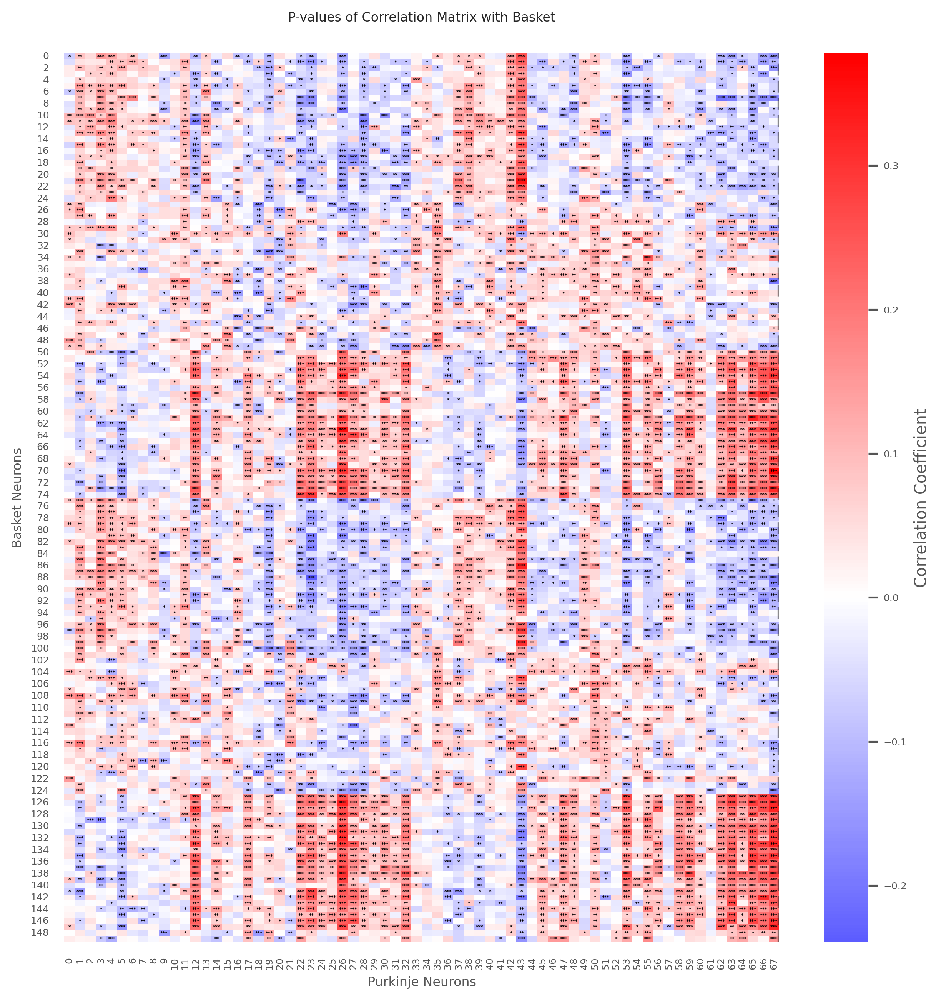

In [58]:
plot_pvalue_corr(corr_matrixBKPC, p_valuesPC, neuronsOFF, neuronsON, title='P-values of Correlation Matrix with Basket', neurons_boundary=neurons_bound, alpha=0.05)

PC ON neurons: 10
PC OFF neurons: 58


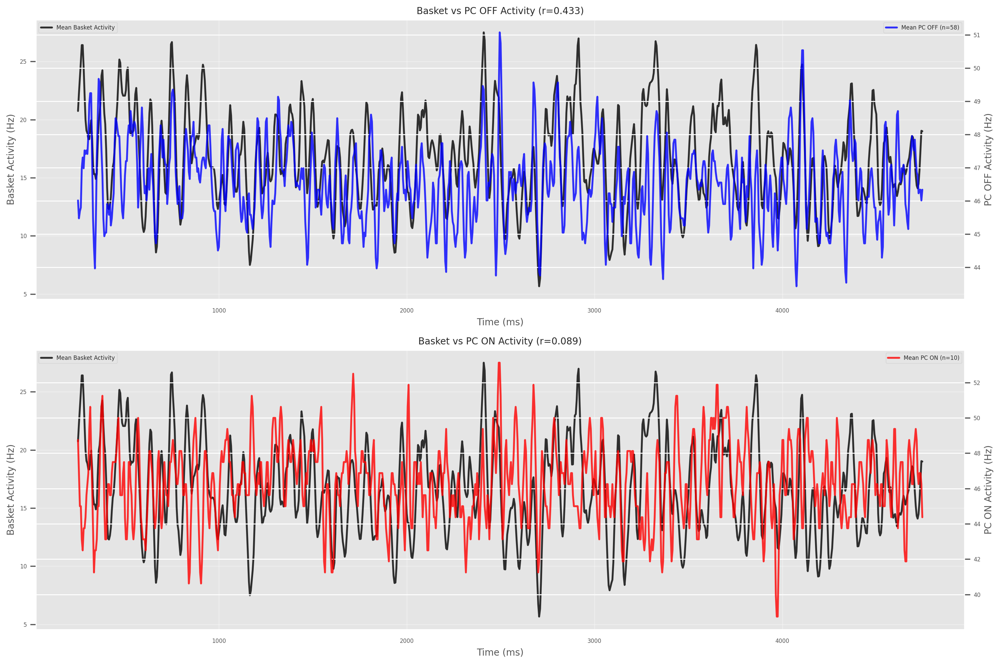

Basket ↔ PC OFF correlation: 0.433
Basket ↔ PC ON correlation:  0.089
Correlation difference: 0.343
PC ON positively correlates with Basket
PC OFF and Basket show positive correlation (both suppressed together)
CORR SCORE: 0.343


In [36]:
# USEFUL WHEN STIMULUS

def plot_basket_pc_corr(basket_rates, pc_rates, pc_clusters, time_vector):
    """
    Args:
        basket_rates: basket cell firing rates (n_basket_neurons, n_time_bins)
        pc_rates: Purkinje cell firing rates (n_pc_neurons, n_time_bins)
        pc_clusters: cluster labels from PC clustering (0=OFF, 1=ON)
        time_vector: time vector for x-axis
    """
    
    # Get PC groups
    pc_on_indices = np.where(pc_clusters == 1)[0]
    pc_off_indices = np.where(pc_clusters == 0)[0]
    
    # Calculate mean activities
    mean_basket = np.mean(basket_rates, axis=0)
    mean_pc_on = np.mean(pc_rates[pc_on_indices, :], axis=0) if len(pc_on_indices) > 0 else np.zeros(pc_rates.shape[1])
    mean_pc_off = np.mean(pc_rates[pc_off_indices, :], axis=0) if len(pc_off_indices) > 0 else np.zeros(pc_rates.shape[1])

    print(f"PC ON neurons: {len(pc_on_indices)}")
    print(f"PC OFF neurons: {len(pc_off_indices)}")
    

    fig, axes = plt.subplots(2, 1, figsize=(15, 10))
    
    # Plot 1: Basket vs PC OFF 
    axes[0].plot(time_vector, mean_basket, 'black', linewidth=2, label='Mean Basket Activity', alpha=0.8)
    ax0_twin = axes[0].twinx()
    ax0_twin.plot(time_vector, mean_pc_off, 'blue', linewidth=2, label=f'Mean PC OFF (n={len(pc_off_indices)})', alpha=0.8)
    
    corr_off = np.corrcoef(mean_basket, mean_pc_off)[0, 1] if len(pc_off_indices) > 0 else 0
    
    axes[0].set_xlabel('Time (ms)')
    axes[0].set_ylabel('Basket Activity (Hz)')
    ax0_twin.set_ylabel('PC OFF Activity (Hz)')
    axes[0].set_title(f'Basket vs PC OFF Activity (r={corr_off:.3f})')
    axes[0].legend(loc='upper left')
    ax0_twin.legend(loc='upper right')
    axes[0].grid(True, alpha=0.3)
    
    # Plot 2: Basket vs PC ON 
    axes[1].plot(time_vector, mean_basket, 'black', linewidth=2, label='Mean Basket Activity', alpha=0.8)
    ax1_twin = axes[1].twinx()
    ax1_twin.plot(time_vector, mean_pc_on, 'red', linewidth=2, label=f'Mean PC ON (n={len(pc_on_indices)})', alpha=0.8)
    
    # Calculate correlation
    corr_on = np.corrcoef(mean_basket, mean_pc_on)[0, 1] if len(pc_on_indices) > 0 else 0
    
    axes[1].set_xlabel('Time (ms)')
    axes[1].set_ylabel('Basket Activity (Hz)')
    ax1_twin.set_ylabel('PC ON Activity (Hz)')
    axes[1].set_title(f'Basket vs PC ON Activity (r={corr_on:.3f})')
    axes[1].legend(loc='upper left')
    ax1_twin.legend(loc='upper right')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    

    print(f"=" * 50)
    print(f"Basket ↔ PC OFF correlation: {corr_off:.3f}")
    print(f"Basket ↔ PC ON correlation:  {corr_on:.3f}")
    print(f"Correlation difference: {abs(corr_off - corr_on):.3f}")
    
    if corr_on < -0.2:
        print(f"PC ON negatively correlates with Basket")
    elif corr_on < 0:
        print(f"PC ON slightly negatively correlates with Basket")
    else:
        print(f"PC ON positively correlates with Basket")
    
    if corr_off > 0.2:
        print(f"PC OFF and Basket show positive correlation (both suppressed together)")
    elif corr_off > 0:
        print(f"PC OFF and Basket show weak positive correlation")
    else:
        print(f"PC OFF and Basket do not correlate as expected")
    
    # Overall conclusion
    corr_score = -corr_on + corr_off  # Higher score = better seesaw
    print(f"CORR SCORE: {corr_score:.3f}")

plot_basket_pc_corr(
    rates_per_neuronBK,
    rates_per_neuronPC, 
    clusters_pc,
    times_vectorBK
)

In [37]:
def basketPC_correlations(rates_per_neuronBK, rates_per_neuronPC):
    """
    Analyze the correlation between Basket Cells and Purkinje Cells activity.
    """
    neurons_corr = np.zeros((rates_per_neuronPC.shape[0],))
    print(neurons_corr.shape)

    mean_basket = np.mean(rates_per_neuronBK, axis=0)
    print(f"Mean Basket shape: {mean_basket.shape}")
    
    for idx, rates in enumerate(rates_per_neuronPC):
        corr = np.corrcoef(rates, mean_basket)[0, 1]
        neurons_corr[idx] = corr
    
    print(f"Shape of correlation vector: {neurons_corr.shape}")

    return neurons_corr

basketPC_corr = basketPC_correlations(rates_per_neuronBK, rates_per_neuronPC)

(68,)
Mean Basket shape: (900,)
Shape of correlation vector: (68,)


In [38]:
from fooof import FOOOF

def extract_fooof_features(psd_data, freqs):
    """
    Extract comprehensive FOOOF features for each Purkinje cell
    """
    n_peaks = 3
    all_features = []
    for cell, psd in enumerate(psd_data):
        cell_features = np.zeros(n_peaks * 3 + 2 + 1)
        peak_params = []
        fm = FOOOF(peak_width_limits=(22, 1500))
        fm.fit(freqs, psd)
        print(f"For cell {cell}")
        print(f"error of the model: {fm.error_:.4f}")
        print(f"R^2 of the model: {fm.r_squared_:.4f}\n")

        # aperiodic parameters
        aperiodic_params = fm.get_params('aperiodic_params')
        offset = aperiodic_params[0]
        exponent = aperiodic_params[1]
        
        # peak parameters
        peak_ = fm.get_params('peak_params')
        if len(peak_) > 0:
            arg_peak = peak_[peak_[:, 1].argsort()[::-1]]
            sorted_peaks = arg_peak[:n_peaks, :]

            for i , peak in enumerate(sorted_peaks):
                cell_features[i*3:(i+1)*3] = peak
        
        cell_features[-3] = offset
        cell_features[-2] = exponent
        cell_features[-1] = np.sum(psd)  # total power
        all_features.append(cell_features)

    all_features = np.array(all_features)
    print(f"Extracted FOOOF features shape: {all_features.shape}")
    return all_features

/tmp/ipykernel_28546/5227365.py:1: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


In [39]:
foof_features = extract_fooof_features(psd_pc, freqs_pc)
print(foof_features[0])


For cell 0
error of the model: 0.6532
R^2 of the model: 0.7655

For cell 1
error of the model: 0.6873
R^2 of the model: 0.7297

For cell 2
error of the model: 0.6128
R^2 of the model: 0.7497

For cell 3
error of the model: 0.6308
R^2 of the model: 0.7331

For cell 4
error of the model: 0.6158
R^2 of the model: 0.7228

For cell 5
error of the model: 0.7329
R^2 of the model: 0.6798

For cell 6
error of the model: 0.6281
R^2 of the model: 0.7624

For cell 7
error of the model: 0.7474
R^2 of the model: 0.7107

For cell 8
error of the model: 0.7678
R^2 of the model: 0.6596

For cell 9
error of the model: 0.6331
R^2 of the model: 0.7687

For cell 10
error of the model: 0.7536
R^2 of the model: 0.6671

For cell 11
error of the model: 0.6578
R^2 of the model: 0.7458

For cell 12
error of the model: 0.7482
R^2 of the model: 0.6772

For cell 13
error of the model: 0.6430
R^2 of the model: 0.7217

For cell 14
error of the model: 0.6787
R^2 of the model: 0.6973

For cell 15
error of the model: 0.7

In [40]:
foof_features_df = pd.DataFrame(foof_features, columns=[
    'Peak1_Freq', 'Peak1_Power', 'Peak1_Bandwidth',
    'Peak2_Freq', 'Peak2_Power', 'Peak2_Bandwidth',
    'Peak3_Freq', 'Peak3_Power', 'Peak3_Bandwidth',
    'Aperiodic_Offset', 'Aperiodic_Exponent', 'Total_Power'
])
foof_features_df.head()

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Peak2_Freq,Peak2_Power,Peak2_Bandwidth,Peak3_Freq,Peak3_Power,Peak3_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Power
0,3550.242895,4.107621,27.874457,3699.024065,3.813531,30.849235,1258.047753,3.658686,22.000000,4.990496,3.218785,4.431689
1,3605.321756,3.747496,27.609713,1229.277393,3.156734,1028.069757,3438.341942,2.984855,813.427946,4.756318,3.088190,3.948356
2,1235.772241,3.894453,68.263223,2111.705212,3.500901,27.113362,3287.209585,3.167237,659.052138,4.964558,3.183248,4.193942
3,3778.552659,3.226569,22.000000,1913.589777,3.071464,22.000000,1359.313087,3.042246,101.116150,4.483234,2.947904,3.828746
4,1201.848405,3.371599,45.930026,3718.731267,3.036004,22.000000,3789.439704,3.019843,22.000000,4.458322,2.984396,2.890321


In [41]:
def corr_pvalue(feature1, feature2, dof=68):
    """
    Calculate the p-value for the correlation between two features.
    
    Args:
        feature1: first feature array
        feature2: second feature array
        dof: degrees of freedom (default is 68)

    Returns:
        p_value: p-value for the correlation
    """
    r = np.corrcoef(feature1, feature2)[0, 1]
    t_stat = r * np.sqrt((dof - 2) / (1 - r**2))
    p_value = 2 * (1 - stats.t.cdf(np.abs(t_stat), df=dof - 2))
    return p_value, r

(68, 13)


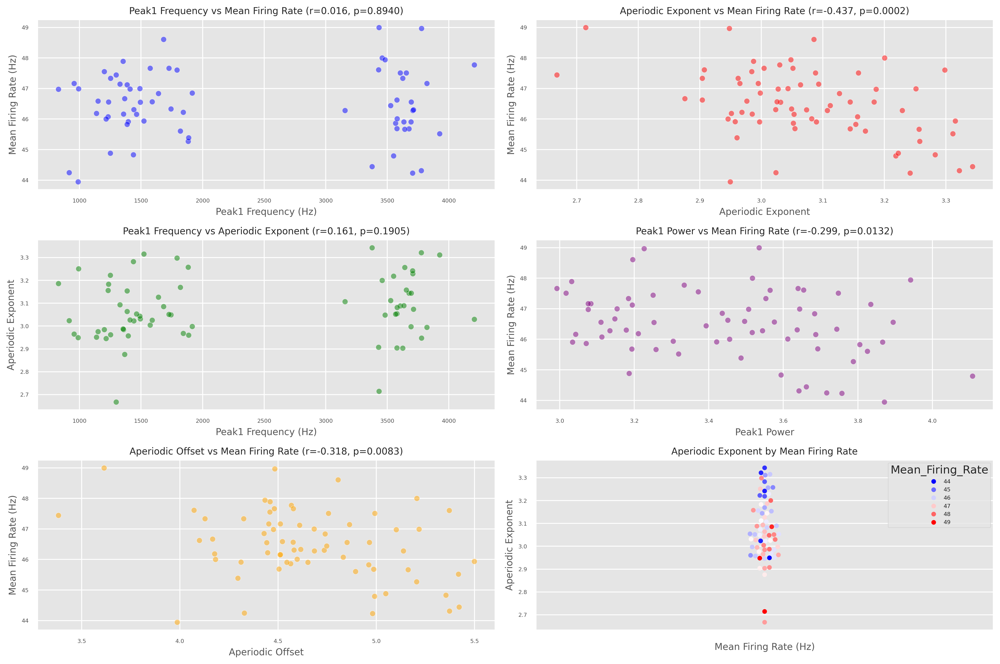

In [43]:
mean_rate = rates_per_neuronPC.mean(axis=1)
mean_rateBK = rates_per_neuronBK.mean(axis=1)
foof_features_df['Mean_Firing_Rate'] = mean_rate
# foof_features_df = foof_features_df.sort_values(by='Aperiodic_Exponent', ascending=False)
print(foof_features_df.shape)

fig, axs = plt.subplots(3, 2, figsize=(15, 10), dpi=300)

# Mean Freq vs Peak Freq
pvalue1, r1 = corr_pvalue(foof_features_df['Peak1_Freq'], foof_features_df['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features_df, x='Peak1_Freq', y='Mean_Firing_Rate', ax=axs[0, 0], color='blue', alpha=0.5)
axs[0, 0].set_title(f'Peak1 Frequency vs Mean Firing Rate (r={r1:.3f}, p={pvalue1:.4f})')
axs[0, 0].set_xlabel('Peak1 Frequency (Hz)')
axs[0, 0].set_ylabel('Mean Firing Rate (Hz)')

# Mean Freq vs Slope
pvalue2, r2 = corr_pvalue(foof_features_df['Aperiodic_Exponent'], foof_features_df['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features_df, x='Aperiodic_Exponent', y='Mean_Firing_Rate', ax=axs[0, 1], color='red', alpha=0.5)
axs[0, 1].set_title(f'Aperiodic Exponent vs Mean Firing Rate (r={r2:.3f}, p={pvalue2:.4f})')
axs[0, 1].set_xlabel('Aperiodic Exponent')
axs[0, 1].set_ylabel('Mean Firing Rate (Hz)')

# Peak Freq vs Aperiodic Offset
pvalue3, r3 = corr_pvalue(foof_features_df['Peak1_Freq'], foof_features_df['Aperiodic_Exponent'])
sns.scatterplot(data=foof_features_df, x='Peak1_Freq', y='Aperiodic_Exponent', ax=axs[1, 0], color='green', alpha=0.5)
axs[1, 0].set_title(f'Peak1 Frequency vs Aperiodic Exponent (r={r3:.3f}, p={pvalue3:.4f})')
axs[1, 0].set_xlabel('Peak1 Frequency (Hz)')
axs[1, 0].set_ylabel('Aperiodic Exponent')   

# Power vs Mean Firing Rate
pvalue4, r4 = corr_pvalue(foof_features_df['Peak1_Power'], foof_features_df['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features_df, x='Peak1_Power', y='Mean_Firing_Rate', ax=axs[1, 1], color='purple', alpha=0.5)
axs[1, 1].set_title(f'Peak1 Power vs Mean Firing Rate (r={r4:.3f}, p={pvalue4:.4f})')
axs[1, 1].set_xlabel('Peak1 Power')
axs[1, 1].set_ylabel('Mean Firing Rate (Hz)')

# Bandwidth vs Mean Firing Rate
pvalue5, r5 = corr_pvalue(foof_features_df['Aperiodic_Offset'], foof_features_df['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features_df, x='Aperiodic_Offset', y='Mean_Firing_Rate', ax=axs[2, 0], color='orange', alpha=0.5)
axs[2, 0].set_title(f'Aperiodic Offset vs Mean Firing Rate (r={r5:.3f}, p={pvalue5:.4f})')
axs[2, 0].set_xlabel('Aperiodic Offset')
axs[2, 0].set_ylabel('Mean Firing Rate (Hz)')

# Swarm plot of aperiodic exponent by firing rate
sns.swarmplot(data=foof_features_df, y='Aperiodic_Exponent', hue='Mean_Firing_Rate', palette='bwr')
axs[2, 1].set_title('Aperiodic Exponent by Mean Firing Rate')
axs[2, 1].set_xlabel('Mean Firing Rate (Hz)')
axs[2, 1].set_ylabel('Aperiodic Exponent')



plt.tight_layout()
plt.show()

Linear Regression: Aperiodic_Exponent vs Mean_Firing_Rate
Slope: -3.5593, Intercept: 57.4162, R^2: 0.1909
Sample size: 68
T-statistic: -3.9459, P-value: 0.0002
Standard Error: 0.9020
Significance: ***


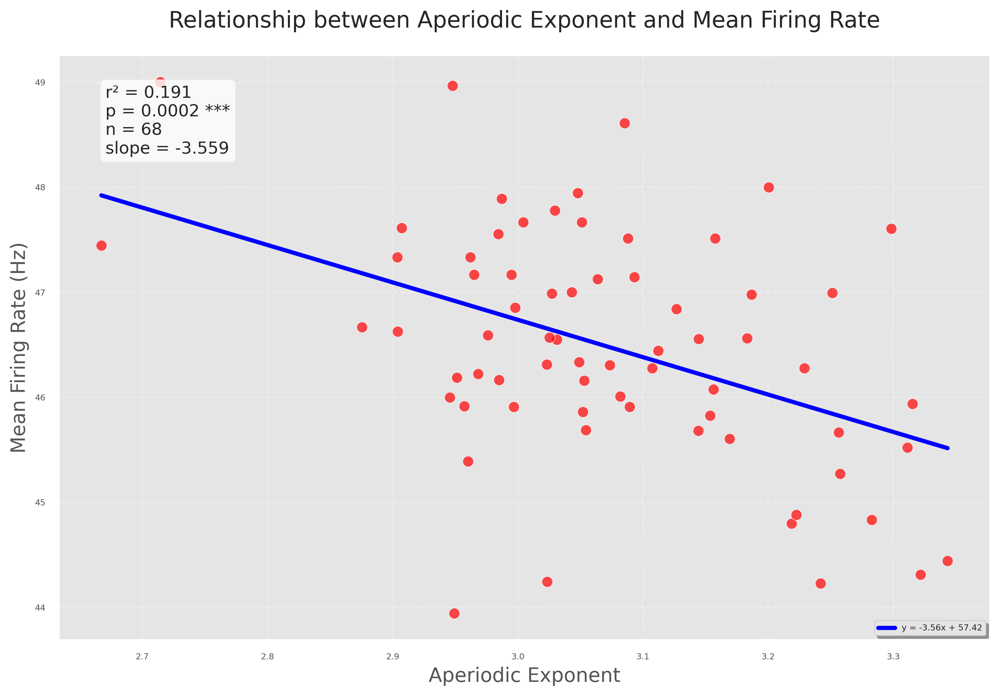

In [ ]:
from sklearn.linear_model import LinearRegression
from scipy import stats
import numpy as np

def regression_analysis(features_df, feature_x, feature_y):
    """
    Perform linear regression analysis between two features.
    """
    x = features_df[feature_x].values.reshape(-1, 1) 
    y = features_df[feature_y].values
    
    model = LinearRegression()
    model.fit(x, y)
    
    slope = model.coef_[0]
    intercept = model.intercept_
    score = model.score(x, y)
    n = len(y)

    print(f"Linear Regression: {feature_x} vs {feature_y}")
    print(f"Slope: {slope:.4f}, Intercept: {intercept:.4f}, R^2: {score:.4f}")
    print(f"Sample size: {n}")

    y_pred = model.predict(x)
    residuals = y - y_pred
    
    # Calculate standard error of the slope
    mse = np.sum(residuals**2) / (n - 2)  # Mean squared error
    x_mean = np.mean(x)
    ss_x = np.sum((x.flatten() - x_mean)**2)  # Sum of squares of X
    
    if ss_x > 0:
        se_slope = np.sqrt(mse / ss_x)  # Standard error of slope
        
        # t-statistic for testing H0: slope = 0
        t_stat = slope / se_slope
        df = n - 2  # degrees of freedom
        
        # Two-tailed p-value
        p_value = 2 * (1 - stats.t.cdf(abs(t_stat), df))
        
        print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")
        print(f"Standard Error: {se_slope:.4f}")
        
        # Significance interpretation
        if p_value < 0.001:
            sig_level = '***'
        elif p_value < 0.01:
            sig_level = '**'
        elif p_value < 0.05:
            sig_level = '*'
        else:
            sig_level = "ns"
        
        print(f"Significance: {sig_level}")
        
    else:
        print("Warning: No variation in X variable!")
        t_stat, p_value = np.nan, np.nan
        sig_level = "ns"

    return model, p_value, sig_level

LR_model, p_value_line, sig_level = regression_analysis(foof_features_df, 'Aperiodic_Exponent', 'Mean_Firing_Rate')

intercept = LR_model.intercept_
slope = LR_model.coef_[0]


fig, ax = plt.subplots(figsize=(10, 7), dpi=300)

# Scatter plot with better styling
scatter = ax.scatter(foof_features_df['Aperiodic_Exponent'], 
                    foof_features_df['Mean_Firing_Rate'], 
                    color='red', alpha=0.7, s=60, edgecolors='white', linewidth=0.5)

# Regression line with confidence interval
x_range = np.linspace(foof_features_df['Aperiodic_Exponent'].min(), 
                     foof_features_df['Aperiodic_Exponent'].max(), 100)
y_range = slope * x_range + intercept

# Calculate confidence interval for regression line
x_mean = np.mean(foof_features_df['Aperiodic_Exponent'])
y_pred = LR_model.predict(foof_features_df['Aperiodic_Exponent'].values.reshape(-1, 1))
residuals = foof_features_df['Mean_Firing_Rate'].values - y_pred
mse = np.sum(residuals**2) / (len(residuals) - 2)

# Plot regression line
ax.plot(x_range, y_range, color='blue', linewidth=3, 
        label=f'y = {slope:.2f}x + {intercept:.2f}')

# Styling improvements
ax.set_xlabel('Aperiodic Exponent', fontsize=14)
ax.set_ylabel('Mean Firing Rate (Hz)', fontsize=14)
ax.set_title('Relationship between Aperiodic Exponent and Mean Firing Rate', 
             fontsize=16, pad=20)

# Improved statistics box
stats_text = f'r² = {LR_model.score(foof_features_df["Aperiodic_Exponent"].values.reshape(-1, 1), foof_features_df["Mean_Firing_Rate"]):.3f}\n'
stats_text += f'p = {p_value_line:.4f} {sig_level}\n'
stats_text += f'n = {len(foof_features_df)}\n'
stats_text += f'slope = {slope:.3f}'

ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
        verticalalignment='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Improved legend and grid
ax.legend(loc='lower right', frameon=True, fancybox=True, shadow=True)
ax.grid(True, alpha=0.3, linestyle='--')


# Tighten layout
plt.tight_layout()
plt.show()

In [52]:
def better_bk_pc_exponent_analysis(foof_features_df, basket_rates, purkinje_rates, clusters=None):
    """
    PC-Basket Cells correlation analysis correlating it also to the aperiodic exponent.
    """
    exponents = foof_features_df['Aperiodic_Exponent'].values
    
    # Population-level correlation
    pop_basket_activity = np.mean(basket_rates, axis=0)  # Population basket activity over time
    pop_pc_activity = np.mean(purkinje_rates, axis=0)  # Population PC activity over time

    print(f"Shape of population basket activity: {pop_basket_activity.shape}") # (900, )
    print(f"Shape of population PC activity: {pop_pc_activity.shape}") # (900, )
    
    # Correlate population activities
    pop_correlation = np.corrcoef(pop_basket_activity, pop_pc_activity)[0, 1]

    # Individual neuron-level analysis
    mean_pc_rates = np.mean(purkinje_rates, axis=1)  # Mean firing rate per PC neuron
    print(f"Shape of mean PC rates: {mean_pc_rates.shape}")  # (68, )
    # Correlate PC mean rates with their aperiodic exponents
    pc_rate_exp_corr = np.corrcoef(mean_pc_rates, exponents)[0, 1]
    
    # For each PC, correlate its activity with mean basket activity
    pc_basket_correlations = np.zeros(len(mean_pc_rates))
    for i in range(len(mean_pc_rates)):
        pc_basket_correlations[i] = np.corrcoef(rates_per_neuronPC[i], pop_basket_activity)[0, 1]
    
    # Correlate these PC-basket correlations with aperiodic exponents
    corr_strength_exp_relation = np.corrcoef(pc_basket_correlations, exponents)[0, 1]
    
    print(f"Population basket-PC correlation: {pop_correlation:.3f}")
    print(f"PC firing rate vs aperiodic exponent correlation: {pc_rate_exp_corr:.3f}")
    print(f"PC-basket correlation strength vs aperiodic exponent: {corr_strength_exp_relation:.3f}")
    
    if clusters is not None:
        neuronsOFF = np.where(clusters == 0)[0]
        neuronsON = np.where(clusters == 1)[0]
        
        # analysis for ON/OFF neurons
        exp_ON = exponents[neuronsON]
        exp_OFF = exponents[neuronsOFF]
        corr_ON = pc_basket_correlations[neuronsON]
        corr_OFF = pc_basket_correlations[neuronsOFF]
        
        corr_exp_ON = np.corrcoef(corr_ON, exp_ON)[0, 1] if len(neuronsON) > 1 else np.nan
        corr_exp_OFF = np.corrcoef(corr_OFF, exp_OFF)[0, 1] if len(neuronsOFF) > 1 else np.nan
        
        print(f"ON neurons - PC-basket corr vs aperiodic exp: {corr_exp_ON:.3f}")
        print(f"OFF neurons - PC-basket corr vs aperiodic exp: {corr_exp_OFF:.3f}")
    
    return {
        'pop_correlation': pop_correlation,
        'pc_rate_exp_corr': pc_rate_exp_corr,
        'corr_strength_exp_relation': corr_strength_exp_relation,
        'pc_basket_correlations': pc_basket_correlations,
        'exponents': exponents
    }

# Use the better approach
results = better_bk_pc_exponent_analysis(foof_features_df, rates_per_neuronBK, rates_per_neuronPC)

Shape of population basket activity: (900,)
Shape of population PC activity: (900,)
Shape of mean PC rates: (68,)
Population basket-PC correlation: 0.411
PC firing rate vs aperiodic exponent correlation: -0.437
PC-basket correlation strength vs aperiodic exponent: -0.415


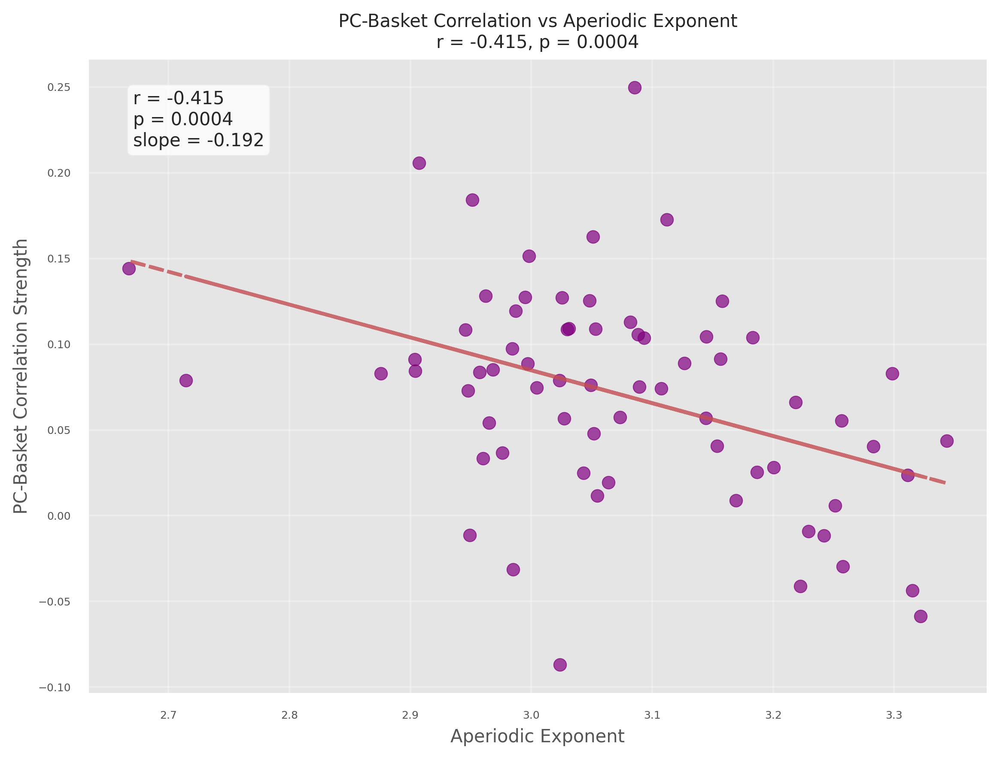

Summary Statistics:
Overall correlation between PC-basket strength and aperiodic exponent: -0.415 (p=0.0004)


In [ ]:
# def plot_pc_basket_vs_exponent(results, foof_features_df, clusters_pc=None):
#     """
#     Plot the relationship between PC-basket correlations and aperiodic exponents
#     """
#     pc_basket_correlations = results['pc_basket_correlations']
#     exponents = results['exponents']
    
#     fig, axes = plt.subplots(1, 2, figsize=(15, 6), dpi=300)
    
#     # Scatter plot of all neurons
#     axes[0].scatter(exponents, pc_basket_correlations, alpha=0.7, s=50, color='purple')
    
#     # correlation line and stats
#     slope, intercept, r_value, p_value, std_err = stats.linregress(exponents, pc_basket_correlations)
#     line = slope * exponents + intercept
#     axes[0].plot(exponents, line, 'r--', alpha=0.8, linewidth=2)
    
#     axes[0].set_xlabel('Aperiodic Exponent')
#     axes[0].set_ylabel('PC-Basket Correlation Strength')
#     axes[0].set_title(f'PC-Basket Correlation vs Aperiodic Exponent\nr = {r_value:.3f}, p = {p_value:.4f}')
#     axes[0].grid(True, alpha=0.3)
    
#     # Add text with correlation info
#     axes[0].text(0.05, 0.95, f'r = {r_value:.3f}\np = {p_value:.4f}\nslope = {slope:.3f}', 
#                 transform=axes[0].transAxes, verticalalignment='top', 
#                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
#     # Separate by ON/OFF clusters if available
#     if clusters_pc is not None:
#         neuronsOFF = np.where(clusters_pc == 0)[0]
#         neuronsON = np.where(clusters_pc == 1)[0]
        
#         # ON neurons
#         axes[1].scatter(exponents[neuronsON], pc_basket_correlations[neuronsON], 
#                        alpha=0.7, s=50, color='red', label=f'ON neurons (n={len(neuronsON)})')
        
#         # OFF neurons  
#         axes[1].scatter(exponents[neuronsOFF], pc_basket_correlations[neuronsOFF], 
#                        alpha=0.7, s=50, color='blue', label=f'OFF neurons (n={len(neuronsOFF)})')
        
#         # Add separate regression lines
#         if len(neuronsON) > 1:
#             slope_on, intercept_on, r_on, p_on, _ = stats.linregress(
#                 exponents[neuronsON], pc_basket_correlations[neuronsON])
#             line_on = slope_on * exponents[neuronsON] + intercept_on
#             axes[1].plot(exponents[neuronsON], line_on, 'r--', alpha=0.8, linewidth=2)
        
#         if len(neuronsOFF) > 1:
#             slope_off, intercept_off, r_off, p_off, _ = stats.linregress(
#                 exponents[neuronsOFF], pc_basket_correlations[neuronsOFF])
#             line_off = slope_off * exponents[neuronsOFF] + intercept_off
#             axes[1].plot(exponents[neuronsOFF], line_off, 'b--', alpha=0.8, linewidth=2)
        
#         axes[1].set_xlabel('Aperiodic Exponent')
#         axes[1].set_ylabel('PC-Basket Correlation Strength')
#         axes[1].set_title('PC-Basket Correlation vs Aperiodic Exponent by ON/OFF State')
#         axes[1].legend()
#         axes[1].grid(True, alpha=0.3)
        
#         # Add correlation stats for each group
#         if len(neuronsON) > 1 and len(neuronsOFF) > 1:
#             stats_text = f'ON: r={r_on:.3f}, p={p_on:.4f}\nOFF: r={r_off:.3f}, p={p_off:.4f}'
#             axes[1].text(0.05, 0.95, stats_text, transform=axes[1].transAxes, 
#                         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
#     else:
#         axes[1].set_visible(False)
    
#     plt.tight_layout()
#     plt.show()
    
#     # Print summary statistics
#     print(f"Summary Statistics:")
#     print(f"Overall correlation between PC-basket strength and aperiodic exponent: {r_value:.3f} (p={p_value:.4f})")
    
#     if clusters_pc is not None and len(neuronsON) > 1 and len(neuronsOFF) > 1:
#         print(f"ON neurons correlation: {r_on:.3f} (p={p_on:.4f})")
#         print(f"OFF neurons correlation: {r_off:.3f} (p={p_off:.4f})")

# # Plot the relationship
# plot_pc_basket_vs_exponent(results, foof_features_df)

In [38]:
def beta_gamma_corr(psd_bk, psd_pc):
    range_mask_beta = (10, 40)  # Hz
    range_mask_gamma = (40, 100)  # Hz

    psd_pc_maskedBeta = psd_mask(freqs_pc, psd_pc, range_mask_beta)
    psd_bk_maskedBeta = psd_mask(freqs_bk, psd_bk, range_mask_beta)

    psd_pc_maskedGamma = psd_mask(freqs_pc, psd_pc, range_mask_gamma)
    psd_bk_maskedGamma = psd_mask(freqs_bk, psd_bk, range_mask_gamma)

    beta_corr = np.zeros((psd_pc.shape[0],))
    gamma_corr = np.zeros((psd_pc.shape[0],))

    # Sum across neurons (axis=0) to get population spectral signature
    sum_beta_bk = psd_bk_maskedBeta.sum(axis=0)  # Shape: (n_frequencies,)
    sum_gamma_bk = psd_bk_maskedGamma.sum(axis=0)  # Shape: (n_frequencies,)
    
    # Correlate each PC neuron's spectrum with basket population spectrum
    for idx, psd_row in enumerate(psd_pc_maskedBeta.values):
        corr = np.corrcoef(psd_row, sum_beta_bk)[0, 1]
        beta_corr[idx] = corr
    
    for idx, psd_row in enumerate(psd_pc_maskedGamma.values):
        corr = np.corrcoef(psd_row, sum_gamma_bk)[0, 1]
        gamma_corr[idx] = corr
    
    print(f"Shape of beta correlation vector: {beta_corr.shape}")
    print(f"Shape of gamma correlation vector: {gamma_corr.shape}")
    
    return beta_corr, gamma_corr

# Now you can capture the results
beta_corr, gamma_corr = beta_gamma_corr(psd_bk, psd_pc)

Frequencies spacing in psd: 11.11 Hz
number of frequencies in the range 10-40 Hz: 3
Extracted frequencies in the range: [11.11111111 22.22222222 33.33333333]
Shape of psd_masked: (68, 3)
Frequencies spacing in psd: 11.11 Hz
number of frequencies in the range 10-40 Hz: 3
Extracted frequencies in the range: [11.11111111 22.22222222 33.33333333]
Shape of psd_masked: (150, 3)
Frequencies spacing in psd: 11.11 Hz
number of frequencies in the range 40-100 Hz: 6
Extracted frequencies in the range: [ 44.44444444  55.55555556  66.66666667  77.77777778  88.88888889
 100.        ]
Shape of psd_masked: (68, 6)
Frequencies spacing in psd: 11.11 Hz
number of frequencies in the range 40-100 Hz: 6
Extracted frequencies in the range: [ 44.44444444  55.55555556  66.66666667  77.77777778  88.88888889
 100.        ]
Shape of psd_masked: (150, 6)
Shape of beta correlation vector: (68,)
Shape of gamma correlation vector: (68,)


In [39]:
print(f"Beta correlation shape: {beta_corr.shape}")
print(f"Gamma correlation shape: {gamma_corr.shape}")

Beta correlation shape: (68,)
Gamma correlation shape: (68,)


In [40]:
def create_combined_feature_matrix(rates_per_neuron, foof_features, basketcorr, beta_corr, gamma_corr):
    n_neurons = rates_per_neuron.shape[0]
    print(f"Basket Correlations shape: {basketcorr.shape}")
    print(f"FOOOF features shape: {foof_features.shape}")
    print(f"Beta correlations shape: {beta_corr.shape}")
    print(f"Gamma correlations shape: {gamma_corr.shape}")
    all_features = []

    # neuron correlation features
    for neuron_idx in range(n_neurons):
        neuron_rates = rates_per_neuron[neuron_idx]
        rates_centered = neuron_rates - np.mean(neuron_rates)
        # autocorrelation
        autocorr = np.correlate(rates_centered, rates_centered, mode='full')
        autocorr = autocorr[autocorr.size // 2:][:3]
        autocorr_normalized = (autocorr - np.mean(autocorr)) / (np.std(autocorr) + 1e-8)

        first_diff = np.diff(rates_centered)
        
        temporal_features = [
            np.mean(np.abs(first_diff)),          
            np.std(first_diff)                  
        ]

        rate_stats = [
            np.mean(neuron_rates),                    # Mean firing rate
            np.std(neuron_rates),                     # Firing rate variability
            np.max(neuron_rates),                     # Peak firing rate
            np.min(neuron_rates)                    # Minimum firing rate
        ]

        pop_mean = np.mean(rates_per_neuron, axis=0)
        pop_corr = np.corrcoef(rates_centered, pop_mean)[0, 1]

        # Combine all features into a single vector
        combined_features = np.concatenate([
            foof_features[neuron_idx],          
            autocorr_normalized,               
            temporal_features,                   
            rate_stats,                          
            [pop_corr],
            [basketcorr[neuron_idx]],
            [beta_corr[neuron_idx]],            # Beta band correlation with basket cells
            [gamma_corr[neuron_idx]]            # Gamma band correlation with basket cells
        ])
        all_features.append(combined_features)

    all_features = np.array(all_features)

    # indices
    foof_start = 0
    foof_end = foof_features.shape[1]
    autocorr_start = foof_end
    autocorr_end = foof_end + 3
    temporal_start = autocorr_end
    temporal_end = autocorr_end + 2
    firing_rate_start = temporal_end
    firing_rate_end = temporal_end + 4
    pop_corr_start = firing_rate_end
    pop_corr_end = firing_rate_end + 1
    basketcorr_start = pop_corr_end
    basketcorr_end = pop_corr_end + 1
    beta_corr_start = basketcorr_end
    beta_corr_end = basketcorr_end + 1
    gamma_corr_start = beta_corr_end
    gamma_corr_end = beta_corr_end + 1
    
    feature_info = {
        "foof": (foof_start, foof_end),
        "autocorr": (autocorr_start, autocorr_end),
        "temporal": (temporal_start, temporal_end),
        "firing_rate": (firing_rate_start, firing_rate_end),
        "pop_corr": (pop_corr_start, pop_corr_end),
        "basket_corr": (basketcorr_start, basketcorr_end),
        "beta_corr": (beta_corr_start, beta_corr_end),
        "gamma_corr": (gamma_corr_start, gamma_corr_end)
    }

    print(f"Combined feature matrix shape: {all_features.shape}")
    return all_features, feature_info

# Update the function call to include the new parameters
combined_features_pc, feature_infoPC = create_combined_feature_matrix(
    rates_per_neuronPC, 
    foof_features, 
    basketPC_corr, 
    beta_corr, 
    gamma_corr
)

Basket Correlations shape: (68,)
FOOOF features shape: (68, 12)
Beta correlations shape: (68,)
Gamma correlations shape: (68,)
Combined feature matrix shape: (68, 25)


In [41]:
combined_features_pc[0]

array([ 3.55024313e+03,  4.10763415e+00,  2.78743746e+01,  3.69902994e+03,
        3.81337562e+00,  3.08698020e+01,  1.25804777e+03,  3.65869245e+00,
        2.20000000e+01,  4.99047645e+00,  3.21877492e+00,  4.43168887e+00,
        1.08594702e+00,  2.41589618e-01, -1.32753664e+00,  2.67658509e+00,
        4.49496308e+00,  4.47986111e+01,  6.88971139e+00,  6.87500000e+01,
        2.50000000e+01,  1.57761365e-01,  6.24055560e-02, -9.91165862e-01,
       -1.82367601e-01])

In [42]:
def standardize_robust(combined_features):
    
    combined_features = combined_features.copy()
    for feature in combined_features:
        std = np.std(feature)
        feature = feature / (std + 1e-8)
    print("-> Feature standardization complete")
    
    return combined_features

combined_features_pc = standardize_robust(combined_features_pc)

-> Feature standardization complete


In [43]:
def plot_feature_statistics(features):
    """
    Simple plotting of feature matrix statistics
    """
    # Calculate basic stats
    means = np.mean(features, axis=0)
    stds = np.std(features, axis=0)
    mins = np.min(features, axis=0)
    maxs = np.max(features, axis=0)
    
    # Create plots
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    # Feature means
    axes[0, 0].hist(means, bins=20, alpha=0.7)
    axes[0, 0].set_title('Feature Means')
    axes[0, 0].set_xlabel('Mean Value')
    
    # Feature standard deviations
    axes[0, 1].hist(stds, bins=20, alpha=0.7)
    axes[0, 1].set_title('Feature Standard Deviations')
    axes[0, 1].set_xlabel('Std Dev')
    
    # Feature minimums
    axes[1, 0].hist(mins, bins=20, alpha=0.7)
    axes[1, 0].set_title('Feature Minimums')
    axes[1, 0].set_xlabel('Min Value')
    
    # Feature maximums
    axes[1, 1].hist(maxs, bins=20, alpha=0.7)
    axes[1, 1].set_title('Feature Maximums')
    axes[1, 1].set_xlabel('Max Value')
    
    plt.tight_layout()
    plt.show()


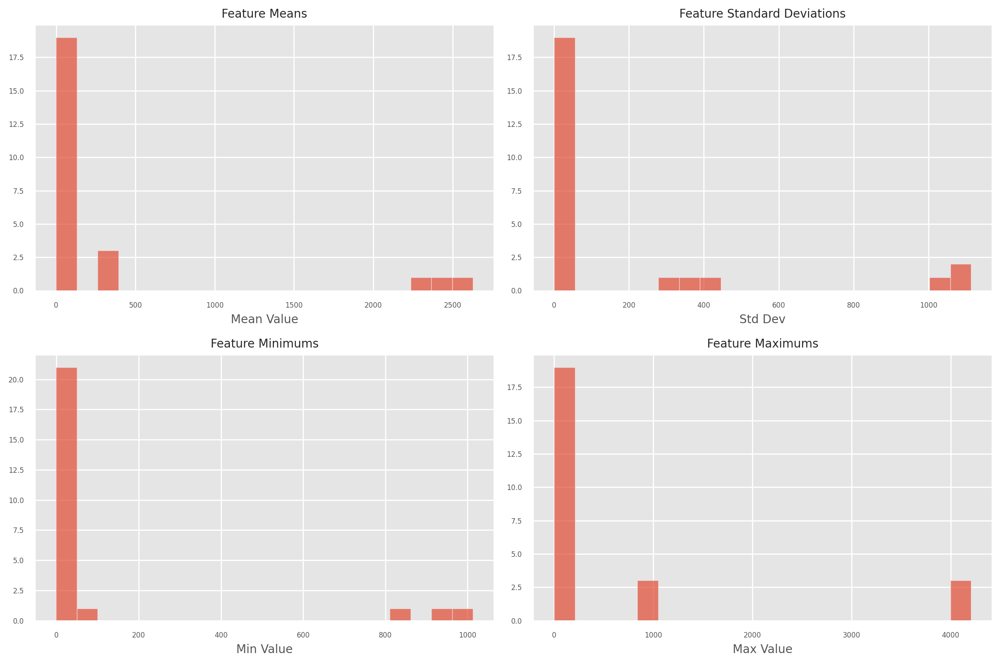

In [44]:
plot_feature_statistics(combined_features_pc)

In [45]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score
import numpy as np
from sklearn.manifold import TSNE


def determine_optimal_clusters(features_scaled, max_k=10, plot=True):
    """
    Determine optimal number of clusters using multiple methods
    """
    
    inertias = []
    silhouette_scores = []
    calinski_scores = []
    davies_bouldin_scores = []
    
    k_range = range(2, max_k + 1)
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        clusters = kmeans.fit_predict(features_scaled)
        
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(features_scaled, clusters))
        calinski_scores.append(calinski_harabasz_score(features_scaled, clusters))
        davies_bouldin_scores.append(davies_bouldin_score(features_scaled, clusters))
    
    # Plot elbow method and silhouette analysis
    if plot:
        fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    
    # Elbow method
        axes[0].plot(k_range, inertias, 'bo-')
        axes[0].set_title('Elbow Method')
        axes[0].set_xlabel('Number of Clusters (k)')
        axes[0].set_ylabel('Inertia')
        
        # Silhouette scores
        axes[1].plot(k_range, silhouette_scores, 'ro-')
        axes[1].set_title('Silhouette Analysis')
        axes[1].set_xlabel('Number of Clusters (k)')
        axes[1].set_ylabel('Silhouette Score')
        
        # Calinski-Harabasz scores
        axes[2].plot(k_range, calinski_scores, 'go-')
        axes[2].set_title('Calinski-Harabasz Index')
        axes[2].set_xlabel('Number of Clusters (k)')
        axes[2].set_ylabel('CH Score')

        axes[3].plot(k_range, davies_bouldin_scores, 'mo-')
        axes[3].set_title('Davies-Bouldin Index')
        axes[3].set_xlabel('Number of Clusters (k)')
        axes[3].set_ylabel('DB Score')
        
        plt.tight_layout()
        plt.show()
    
    return k_range, np.array(silhouette_scores), np.array(calinski_scores), np.array(davies_bouldin_scores)


In [46]:
def neural_clustering(combined_features, rates_per_neuron, times_vector, 
                               max_k=8, plot=True):
    """
    Simplified clustering approach without meta-clustering, with correct firing rate computation
    """
    print("Starting Neural Clustering Analysis...")
    
    # Determine optimal number of clusters
    print("Determining optimal number of clusters...")
    k_range, silhouette_scores, calinski_scores, davies_bouldin_score = determine_optimal_clusters(
        combined_features, max_k=max_k, plot=plot
    )
    
    # Select optimal k based on majority vote from the 3 scores
    print("Selecting optimal number of clusters based on silhouette scores...")
    # Fix silhouette (transform [-1,1] to [0,1])
    silhouette_scoresScaled = (silhouette_scores + 1) / 2

    # Fix calinski-harabasz (min-max normalization)
    calinski_scoresMinMax = (calinski_scores - np.min(calinski_scores)) / (np.max(calinski_scores) - np.min(calinski_scores))

    # Fix davies-bouldin (normalize then invert)
    davies_bouldin_normalized = (davies_bouldin_score - np.min(davies_bouldin_score)) / (np.max(davies_bouldin_score) - np.min(davies_bouldin_score))
    davies_bouldin_scoresScaled = 1 - davies_bouldin_normalized

    combined_scores = (silhouette_scoresScaled + calinski_scoresMinMax + davies_bouldin_scoresScaled) / 3
    print(f"combined scores: {combined_scores}")
    combined_decision = np.argmax(combined_scores)

    silhouette_scoresMax = np.argmax(silhouette_scores)
    calinski_scoresMax = np.argmax(calinski_scores)
    davies_bouldin_scoresMax = np.argmin(davies_bouldin_score)

    voting_scores = np.array([silhouette_scoresMax, calinski_scoresMax, davies_bouldin_scoresMax])
    majority_vote = np.bincount(voting_scores).argmax()

    if combined_decision == majority_vote:
        print(f"Majority and combined scores agree on {combined_decision}")
        optimal_k = combined_decision
    else:
        print(f"Majority vote ({majority_vote}) disagrees with combined scores ({combined_decision})")
        optimal_k = combined_decision 

    optimal_k = k_range[np.argmax(combined_scores)]
    print(f"   Optimal k selected: {optimal_k} (silhouette score: {max(combined_scores):.3f})")
    
    print(f"Running single K-means clustering with k={optimal_k}...")
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(combined_features)
  
    silhouette_final = silhouette_score(combined_features, clusters)
    print(f"   Final silhouette score: {silhouette_final:.3f}")
    
    if plot:
        visualize_clusters_simple(clusters, combined_features, rates_per_neuron, silhouette_final)
    
    return clusters, optimal_k, silhouette_final, combined_features


def visualize_clusters_simple(clusters, features_scaled, rates_per_neuron, silhouette_score):
    """
    Simple visualization with just t-SNE and mean firing rates
    """
    unique_clusters, counts = np.unique(clusters, return_counts=True)
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray']
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
    
    fig.suptitle(f'Neural Clustering Results | Silhouette Score: {silhouette_score:.3f} | Clusters: {len(unique_clusters)}', fontsize=14)
    
    # t-SNE visualization (use scaled features for visualization)
    ax1 = axes[0]
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(features_scaled)-1))
    features_tsne = tsne.fit_transform(features_scaled)
    
    scatter = ax1.scatter(features_tsne[:, 0], features_tsne[:, 1], 
                         c=clusters, cmap='viridis', alpha=0.7, s=60)
    
    # Add neuron labels
    for i, (x, y) in enumerate(features_tsne):
        ax1.annotate(f'{i}', (x, y), xytext=(2, 2), 
                   textcoords='offset points', fontsize=8, alpha=0.7)
    
    ax1.set_title('t-SNE Visualization of Clusters')
    ax1.set_xlabel('t-SNE 1')
    ax1.set_ylabel('t-SNE 2')
    plt.colorbar(scatter, ax=ax1, label='Cluster ID')
    
    # Cluster size and firing rate comparison (using original rates!)
    ax2 = axes[1]
    
    mean_rates_per_cluster = []
    std_rates_per_cluster = []
    cluster_sizes = []
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        
        # Mean firing rate across all neurons in cluster
        cluster_mean_rates = np.mean(cluster_neurons, axis=1)  # Mean across time for each neuron
        mean_rates_per_cluster.append(np.mean(cluster_mean_rates))
        std_rates_per_cluster.append(np.std(cluster_mean_rates))
        cluster_sizes.append(np.sum(cluster_mask))
    
    bars = ax2.bar(unique_clusters, mean_rates_per_cluster, 
                   yerr=std_rates_per_cluster,
                   color=[colors[i % len(colors)] for i in unique_clusters],
                   alpha=0.7, capsize=5)
    
    for i, (cluster_id, rate, size) in enumerate(zip(unique_clusters, mean_rates_per_cluster, cluster_sizes)):
        ax2.text(cluster_id, rate + max(mean_rates_per_cluster)*0.05, f'n={size}', 
                ha='center', va='bottom', fontweight='bold')
    
    ax2.set_xlabel('Cluster ID')
    ax2.set_ylabel('Mean Firing Rate (Hz)')
    ax2.set_title('Average Firing Rate by Cluster')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed cluster analysis using ORIGINAL rates
    print(f"\nDETAILED CLUSTER ANALYSIS")
    print("-" * 50)
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons_indices = np.where(cluster_mask)[0]
        cluster_rates = rates_per_neuron[cluster_mask]  # Use ORIGINAL rates!
        
        print(f"\nCluster {cluster_id}: {np.sum(cluster_mask)} neurons")
        print(f"  Neuron indices: {cluster_neurons_indices[:10]}{'...' if len(cluster_neurons_indices) > 10 else ''}")
        
        # Firing rate statistics using ORIGINAL rates
        mean_rates = np.mean(cluster_rates, axis=1)
        print(f"  Mean firing rate: {np.mean(mean_rates):.2f} ± {np.std(mean_rates):.2f} Hz")
        print(f"  Rate range: {np.min(mean_rates):.2f} - {np.max(mean_rates):.2f} Hz")
        
        # Temporal variability using ORIGINAL rates
        temporal_variability = np.std(cluster_rates, axis=1)
        print(f"  Temporal variability: {np.mean(temporal_variability):.2f} ± {np.std(temporal_variability):.2f}")
    
    # Add cluster validation info
    print(f"\nFINAL CLUSTER VALIDATION")
    print(f"   Silhouette Score: {silhouette_score:.3f}")
    print(f"   Number of Clusters: {len(unique_clusters)}")
    
    return clusters

In [59]:
def neural_clustering(combined_features, rates_per_neuron, times_vector, 
                               max_k=8, plot=True):
    """
    Simplified clustering approach without meta-clustering, with correct firing rate computation
    """
    print("Starting Neural Clustering Analysis...")
    
    # Determine optimal number of clusters
    print("Determining optimal number of clusters...")
    k_range, silhouette_scores, calinski_scores, davies_bouldin_score = determine_optimal_clusters(
        combined_features, max_k=max_k, plot=plot
    )
    
    # Select optimal k based on majority vote from the 3 scores
    print("Selecting optimal number of clusters based on silhouette scores...")
    # Fix silhouette (transform [-1,1] to [0,1])
    silhouette_scoresScaled = (silhouette_scores + 1) / 2

    # Fix calinski-harabasz (min-max normalization)
    calinski_scoresMinMax = (calinski_scores - np.min(calinski_scores)) / (np.max(calinski_scores) - np.min(calinski_scores))

    # Fix davies-bouldin (normalize then invert)
    davies_bouldin_normalized = (davies_bouldin_score - np.min(davies_bouldin_score)) / (np.max(davies_bouldin_score) - np.min(davies_bouldin_score))
    davies_bouldin_scoresScaled = 1 - davies_bouldin_normalized

    combined_scores = (silhouette_scoresScaled + calinski_scoresMinMax + davies_bouldin_scoresScaled) / 3
    print(f"combined scores: {combined_scores}")
    combined_decision = np.argmax(combined_scores)

    silhouette_scoresMax = np.argmax(silhouette_scores)
    calinski_scoresMax = np.argmax(calinski_scores)
    davies_bouldin_scoresMax = np.argmin(davies_bouldin_score)

    voting_scores = np.array([silhouette_scoresMax, calinski_scoresMax, davies_bouldin_scoresMax])
    majority_vote = np.bincount(voting_scores).argmax()

    if combined_decision == majority_vote:
        print(f"Majority and combined scores agree on {combined_decision}")
        optimal_k = combined_decision
    else:
        print(f"Majority vote ({majority_vote}) disagrees with combined scores ({combined_decision})")
        optimal_k = combined_decision 

    optimal_k = k_range[np.argmax(combined_scores)]
    print(f"   Optimal k selected: {optimal_k} (silhouette score: {max(combined_scores):.3f})")
    
    print(f"Running single K-means clustering with k={optimal_k}...")
    kmeans = KMeans(n_clusters=optimal_k, random_state=2, n_init=10)
    clusters = kmeans.fit_predict(combined_features)
  
    silhouette_final = silhouette_score(combined_features, clusters)
    print(f"   Final silhouette score: {silhouette_final:.3f}")
    
    if plot:
        visualize_clusters(clusters, combined_features, rates_per_neuron, silhouette_final)
    
    return clusters, optimal_k, silhouette_final, combined_features

def visualize_clusters(clusters, features_scaled, rates_per_neuron, silhouette_score):
    """
    Visualization with just t-SNE and mean firing rates
    """
    unique_clusters, counts = np.unique(clusters, return_counts=True)
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray']
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
    
    fig.suptitle(f'Neural Clustering Results | Silhouette Score: {silhouette_score:.3f} | Clusters: {len(unique_clusters)}', fontsize=14)
    
    # t-SNE visualization (use scaled features for visualization)
    ax1 = axes[0]
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(features_scaled)-1))
    features_tsne = tsne.fit_transform(features_scaled)
    
    scatter = ax1.scatter(features_tsne[:, 0], features_tsne[:, 1], 
                         c=clusters, cmap='viridis', alpha=0.7, s=60)
    
    # Add neuron labels
    for i, (x, y) in enumerate(features_tsne):
        ax1.annotate(f'{i}', (x, y), xytext=(2, 2), 
                   textcoords='offset points', fontsize=8, alpha=0.7)
    
    ax1.set_title('t-SNE Visualization of Clusters')
    ax1.set_xlabel('t-SNE 1')
    ax1.set_ylabel('t-SNE 2')
    plt.colorbar(scatter, ax=ax1, label='Cluster ID')
    
    # Cluster size and firing rate comparison (using original rates!)
    ax2 = axes[1]
    
    mean_rates_per_cluster = []
    std_rates_per_cluster = []
    cluster_sizes = []
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        
        # Mean firing rate across all neurons in cluster
        cluster_mean_rates = np.mean(cluster_neurons, axis=1)  # Mean across time for each neuron
        mean_rates_per_cluster.append(np.mean(cluster_mean_rates))
        std_rates_per_cluster.append(np.std(cluster_mean_rates))
        cluster_sizes.append(np.sum(cluster_mask))
    
    bars = ax2.bar(unique_clusters, mean_rates_per_cluster, 
                   yerr=std_rates_per_cluster,
                   color=[colors[i % len(colors)] for i in unique_clusters],
                   alpha=0.7, capsize=5)
    
    for i, (cluster_id, rate, size) in enumerate(zip(unique_clusters, mean_rates_per_cluster, cluster_sizes)):
        ax2.text(cluster_id, rate + max(mean_rates_per_cluster)*0.05, f'n={size}', 
                ha='center', va='bottom', fontweight='bold')
    
    ax2.set_xlabel('Cluster ID')
    ax2.set_ylabel('Mean Firing Rate (Hz)')
    ax2.set_title('Average Firing Rate by Cluster')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed cluster analysis using ORIGINAL rates
    print(f"\nDETAILED CLUSTER ANALYSIS")
    print("-" * 50)
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons_indices = np.where(cluster_mask)[0]
        cluster_rates = rates_per_neuron[cluster_mask]  # Use ORIGINAL rates!
        
        print(f"\nCluster {cluster_id}: {np.sum(cluster_mask)} neurons")
        print(f"  Neuron indices: {cluster_neurons_indices[:10]}{'...' if len(cluster_neurons_indices) > 10 else ''}")
        
        # Firing rate statistics using ORIGINAL rates
        mean_rates = np.mean(cluster_rates, axis=1)
        print(f"  Mean firing rate: {np.mean(mean_rates):.2f} ± {np.std(mean_rates):.2f} Hz")
        print(f"  Rate range: {np.min(mean_rates):.2f} - {np.max(mean_rates):.2f} Hz")
        
        # Temporal variability using ORIGINAL rates
        temporal_variability = np.std(cluster_rates, axis=1)
        print(f"  Temporal variability: {np.mean(temporal_variability):.2f} ± {np.std(temporal_variability):.2f}")
    
    # Add cluster validation info
    print(f"\nFINAL CLUSTER VALIDATION")
    print(f"   Silhouette Score: {silhouette_score:.3f}")
    print(f"   Number of Clusters: {len(unique_clusters)}")

    # Print detailed cluster analysis using ORIGINAL rates
    print(f"\nDETAILED CLUSTER ANALYSIS")
    print("-" * 50)
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons_indices = np.where(cluster_mask)[0]
        cluster_rates = rates_per_neuron[cluster_mask]  # Use ORIGINAL rates!
        
        print(f"\nCluster {cluster_id}: {np.sum(cluster_mask)} neurons")
        print(f"  Neuron indices: {cluster_neurons_indices[:10]}{'...' if len(cluster_neurons_indices) > 10 else ''}")
        
        # Firing rate statistics using ORIGINAL rates
        mean_rates = np.mean(cluster_rates, axis=1)
        print(f"  Mean firing rate: {np.mean(mean_rates):.2f} ± {np.std(mean_rates):.2f} Hz")
        print(f"  Rate range: {np.min(mean_rates):.2f} - {np.max(mean_rates):.2f} Hz")
        
        # Temporal variability using ORIGINAL rates
        temporal_variability = np.std(cluster_rates, axis=1)
        print(f"  Temporal variability: {np.mean(temporal_variability):.2f} ± {np.std(temporal_variability):.2f}")
    
    # Add cluster validation info
    print(f"\nFINAL CLUSTER VALIDATION")
    print(f"   Silhouette Score: {silhouette_score:.3f}")
    print(f"   Number of Clusters: {len(unique_clusters)}")
    
    return clusters

Starting Neural Clustering Analysis...
Determining optimal number of clusters...


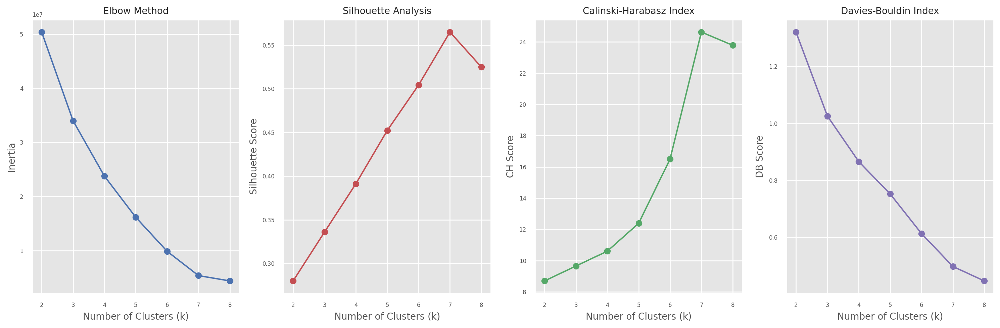

Selecting optimal number of clusters based on silhouette scores...
combined scores: [0.21334008 0.35510676 0.4451681  0.53600101 0.6837957  0.90808366
 0.90308863]
Majority and combined scores agree on 5
   Optimal k selected: 7 (silhouette score: 0.908)
Running single K-means clustering with k=7...
   Final silhouette score: 0.565


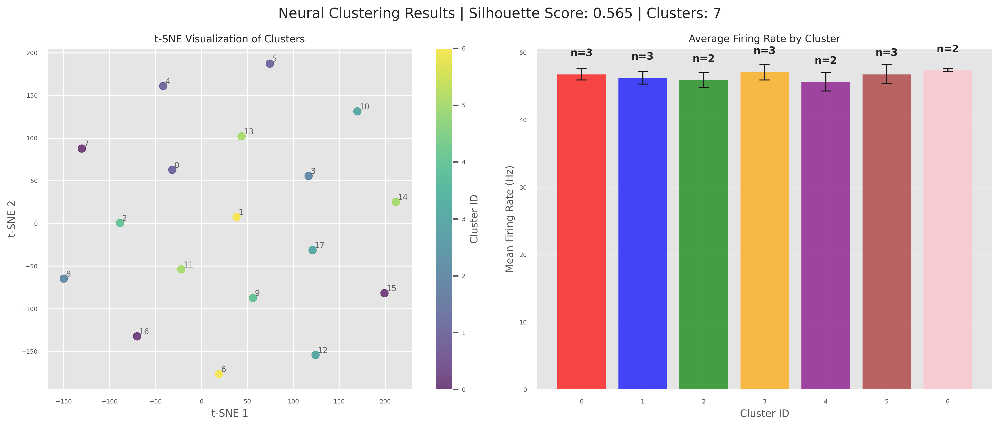


DETAILED CLUSTER ANALYSIS
--------------------------------------------------

Cluster 0: 3 neurons
  Neuron indices: [ 7 15 16]
  Mean firing rate: 46.79 ± 0.86 Hz
  Rate range: 46.08 - 48.00 Hz
  Temporal variability: 6.87 ± 0.25

Cluster 1: 3 neurons
  Neuron indices: [0 4 5]
  Mean firing rate: 46.23 ± 0.91 Hz
  Rate range: 45.52 - 47.51 Hz
  Temporal variability: 6.62 ± 0.09

Cluster 2: 2 neurons
  Neuron indices: [3 8]
  Mean firing rate: 45.94 ± 1.06 Hz
  Rate range: 44.88 - 46.99 Hz
  Temporal variability: 6.66 ± 0.09

Cluster 3: 3 neurons
  Neuron indices: [10 12 17]
  Mean firing rate: 47.09 ± 1.15 Hz
  Rate range: 45.83 - 48.61 Hz
  Temporal variability: 6.80 ± 0.04

Cluster 4: 2 neurons
  Neuron indices: [2 9]
  Mean firing rate: 45.66 ± 1.34 Hz
  Rate range: 44.31 - 47.00 Hz
  Temporal variability: 6.68 ± 0.10

Cluster 5: 3 neurons
  Neuron indices: [11 13 14]
  Mean firing rate: 46.80 ± 1.39 Hz
  Rate range: 44.83 - 47.89 Hz
  Temporal variability: 6.94 ± 0.27

Cluster 6:

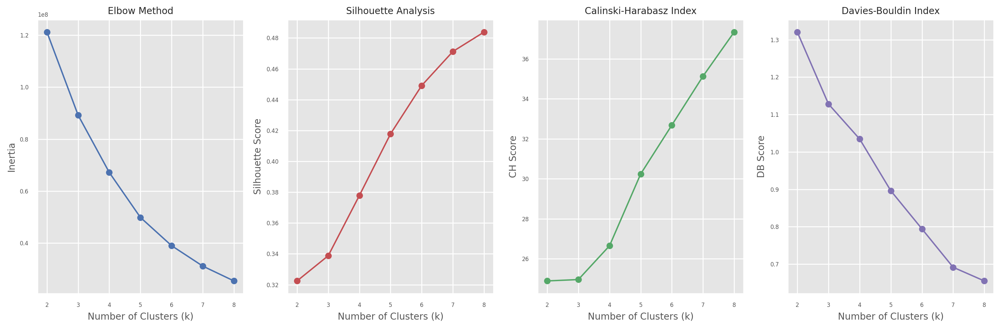

Selecting optimal number of clusters based on silhouette scores...
combined scores: [0.22040871 0.32130498 0.4199166  0.59209796 0.71383877 0.83442565
 0.91397215]
Majority and combined scores agree on 6
   Optimal k selected: 8 (silhouette score: 0.914)
Running single K-means clustering with k=8...
   Final silhouette score: 0.484


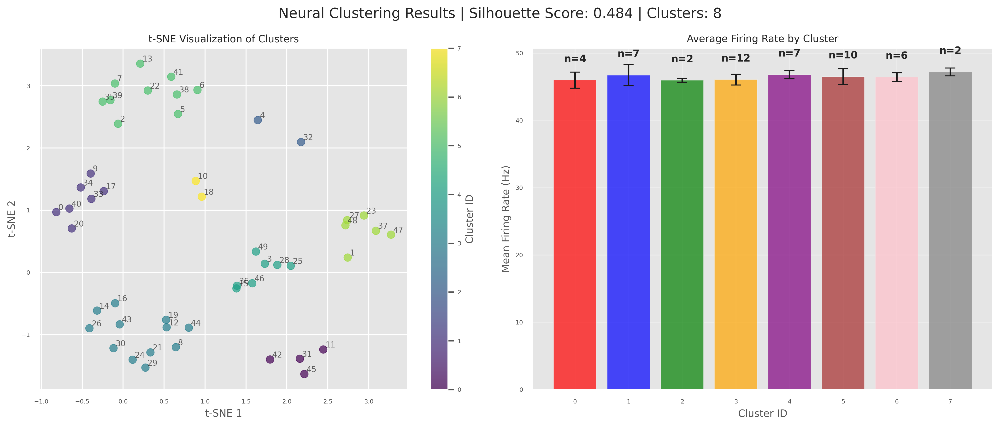


DETAILED CLUSTER ANALYSIS
--------------------------------------------------

Cluster 0: 4 neurons
  Neuron indices: [11 31 42 45]
  Mean firing rate: 46.00 ± 1.18 Hz
  Rate range: 44.24 - 47.17 Hz
  Temporal variability: 6.74 ± 0.37

Cluster 1: 7 neurons
  Neuron indices: [ 0  9 17 20 33 34 40]
  Mean firing rate: 46.74 ± 1.59 Hz
  Rate range: 44.44 - 49.00 Hz
  Temporal variability: 6.87 ± 0.26

Cluster 2: 2 neurons
  Neuron indices: [ 4 32]
  Mean firing rate: 45.98 ± 0.30 Hz
  Rate range: 45.69 - 46.28 Hz
  Temporal variability: 6.67 ± 0.37

Cluster 3: 12 neurons
  Neuron indices: [ 8 12 14 16 19 21 24 26 29 30]...
  Mean firing rate: 46.08 ± 0.80 Hz
  Rate range: 43.94 - 47.33 Hz
  Temporal variability: 6.69 ± 0.32

Cluster 4: 7 neurons
  Neuron indices: [ 3 15 25 28 36 46 49]
  Mean firing rate: 46.80 ± 0.61 Hz
  Rate range: 46.01 - 47.67 Hz
  Temporal variability: 6.66 ± 0.38

Cluster 5: 10 neurons
  Neuron indices: [ 2  5  6  7 13 22 35 38 39 41]
  Mean firing rate: 46.50 ± 1.

In [60]:
neuronsON_feat = combined_features_pc[neuronsON]
neuronsOFF_feat = combined_features_pc[neuronsOFF]

clusters_pcON, _, _, _ = neural_clustering(
    neuronsON_feat, rates_per_neuronPC[neuronsON], times_vectorPC,
    max_k=8, plot=True
)
clusters_pcOFF, _, _, _ = neural_clustering(
    neuronsOFF_feat, rates_per_neuronPC[neuronsOFF], times_vectorPC,
    max_k=8, plot=True
)

In [57]:
clusters_pcON = {'clusters': clusters_pcON, 'neurons': neuronsON}

clusters_pcOFF = {'clusters': clusters_pcOFF, 'neurons': neuronsOFF}

In [58]:
clusters_pcOFF

{'clusters': {'clusters': array([1, 6, 5, 4, 2, 5, 5, 5, 3, 1, 7, 0, 3, 5, 3, 4, 3, 1, 7, 3, 1, 3,
         5, 6, 3, 4, 3, 6, 4, 3, 3, 0, 2, 1, 1, 5, 4, 6, 5, 5, 1, 5, 0, 3,
         3, 0, 4, 6, 6, 4], dtype=int32),
  'neurons': array([ 0,  2,  3,  4,  5,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20,
         21, 22, 23, 25, 26, 28, 29, 30, 31, 32, 34, 35, 36, 38, 39, 40, 42,
         43, 45, 48, 49, 51, 53, 54, 55, 56, 58, 60, 61, 63, 65, 66, 67])},
 'neurons': array([ 0,  2,  3,  4,  5,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20,
        21, 22, 23, 25, 26, 28, 29, 30, 31, 32, 34, 35, 36, 38, 39, 40, 42,
        43, 45, 48, 49, 51, 53, 54, 55, 56, 58, 60, 61, 63, 65, 66, 67])}

In [61]:
def cohenD(gp1, gp2):
    """
    d = (mean₁ - mean₂) / pooled_standard_deviation
    """
    mean1, mean2 = np.mean(gp1), np.mean(gp2)
    std1, std2 = np.std(gp1), np.std(gp2)
    n1, n2 = len(gp1), len(gp2)
    pooled_std = np.sqrt(((n1-1)*(std1)**2 + (n2-1)*(std2)**2) / (n1+n2-2))
    d = (mean1 - mean2) / pooled_std

    return d

def get_feature_type(feature_idx, feature_info):
    """Map feature index back to feature group name"""
    for group_name, indices in feature_info.items():
        if isinstance(indices, tuple) and indices[0] <= feature_idx < indices[1]:
            return group_name
    return "unknown"

def analyze_features_clusters(clusters, featuresM, featureInfo):
    uniqueClusters = np.unique(clusters)
    cluster_counts = np.bincount(clusters)
    
    valid_clusters = [c for c in uniqueClusters if cluster_counts[c] >= 2]
    print(f"Valid clusters: {valid_clusters}")
    
    all_effects = []
    
    for c1 in valid_clusters:
        for c2 in valid_clusters:
            if c1 >= c2:
                continue
                
            clusterMask = clusters == c1
            clusterMaskOther = clusters == c2
            
            # print(f"\nAnalyzing cluster {c1} ({np.sum(clusterMask)} neurons) vs cluster {c2} ({np.sum(clusterMaskOther)} neurons)")
            
            for featureIdx in range(featuresM.shape[1]):
                currGroup = featuresM[clusterMask, featureIdx]
                otherGroup = featuresM[clusterMaskOther, featureIdx]
                
                effectSize = cohenD(currGroup, otherGroup)
                if not np.isnan(effectSize):
                    # Store: (feature_index, effect_size, cluster_pair, abs_effect_size)
                    all_effects.append((featureIdx, effectSize, (c1, c2), abs(effectSize)))
    
    # Find most distinctive features
    print("\n" + "="*50)
    print("MOST DISTINCTIVE FEATURES OVERALL")
    print("="*50)
    
    # Sort by absolute effect size
    all_effects.sort(key=lambda x: x[3], reverse=True)  # Sort by abs(effect_size)
    
    # Show top 10 most distinctive features
    print("Top 10 most discriminative features across all cluster pairs:")
    for i, (featureIdx, effect, (c1, c2), abs_effect) in enumerate(all_effects[:10]):
        direction = f"C{c1} higher" if effect > 0 else f"C{c2} higher"
        feature_type = get_feature_type(featureIdx, featureInfo)
        print(f"{i+1:2d}. Feature {featureIdx:2d} of type {feature_type}: d={effect:6.3f} (|d|={abs_effect:.3f}) - {direction} in C{c1} vs C{c2}")
    
    return all_effects

In [62]:
analyze_features_clusters(clusters_pcON, combined_features_pc[neuronsON], feature_infoPC)
analyze_features_clusters(clusters_pcOFF, combined_features_pc[neuronsOFF], feature_infoPC)

Valid clusters: [np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6)]

MOST DISTINCTIVE FEATURES OVERALL
Top 10 most discriminative features across all cluster pairs:
 1. Feature 19 of type firing_rate: d=  -inf (|d|=inf) - C4 higher in C2 vs C4
 2. Feature  5 of type foof: d=509.048 (|d|=509.048) - C1 higher in C1 vs C5
 3. Feature  5 of type foof: d=105.666 (|d|=105.666) - C1 higher in C1 vs C6
 4. Feature  5 of type foof: d=74.706 (|d|=74.706) - C1 higher in C1 vs C3
 5. Feature 22 of type basket_corr: d=-57.901 (|d|=57.901) - C6 higher in C2 vs C6
 6. Feature  5 of type foof: d=-52.548 (|d|=52.548) - C1 higher in C0 vs C1
 7. Feature  0 of type foof: d=30.644 (|d|=30.644) - C1 higher in C1 vs C2
 8. Feature  0 of type foof: d=27.691 (|d|=27.691) - C1 higher in C1 vs C5
 9. Feature  0 of type foof: d=-25.806 (|d|=25.806) - C4 higher in C2 vs C4
10. Feature 22 of type basket_corr: d=25.004 (|d|=25.004) - C0 higher in C0 vs C2
Valid clusters: [np.

/tmp/ipykernel_39715/1473460625.py:9: RuntimeWarning: divide by zero encountered in scalar divide
  d = (mean1 - mean2) / pooled_std


[(5,
  np.float64(119.7614487785194),
  (np.int32(2), np.int32(7)),
  np.float64(119.7614487785194)),
 (0,
  np.float64(-17.261545284588582),
  (np.int32(4), np.int32(5)),
  np.float64(17.261545284588582)),
 (0,
  np.float64(15.743531325159086),
  (np.int32(1), np.int32(4)),
  np.float64(15.743531325159086)),
 (3,
  np.float64(-14.117380710330698),
  (np.int32(2), np.int32(3)),
  np.float64(14.117380710330698)),
 (0,
  np.float64(-12.822985054004597),
  (np.int32(4), np.int32(7)),
  np.float64(12.822985054004597)),
 (0,
  np.float64(11.361761240620162),
  (np.int32(2), np.int32(4)),
  np.float64(11.361761240620162)),
 (0,
  np.float64(11.199937726907065),
  (np.int32(5), np.int32(6)),
  np.float64(11.199937726907065)),
 (6,
  np.float64(-11.150286548556664),
  (np.int32(0), np.int32(7)),
  np.float64(11.150286548556664)),
 (3,
  np.float64(-10.983449445657307),
  (np.int32(2), np.int32(4)),
  np.float64(10.983449445657307)),
 (3,
  np.float64(-10.735862106159336),
  (np.int32(2), np.in

In [ ]:
def cluster_metadata(rates_per_neuron, sub_clusters):
    clusters_dict = {}
    clusters = sub_clusters['clusters']
    neurons = sub_clusters['neurons']

    unique_clusters = np.unique(clusters)
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons = neurons[cluster_mask]
        
        print(f"\nCluster {cluster_id}: {np.sum(cluster_mask)} neurons")
        print(f"  Neuron indices: {cluster_neurons[:10]}{'...' if len(cluster_neurons) > 10 else ''}")
        
        # Firing rate statistics using ORIGINAL rates
        mean_rates = np.mean(rates_per_neuron[cluster_neurons], axis=1)
        print(f"  Mean firing rate: {np.mean(mean_rates):.2f} ± {np.std(mean_rates):.2f} Hz")
        print(f"  Rate range: {np.min(mean_rates):.2f} - {np.max(mean_rates):.2f} Hz")
        
        # Temporal variability using ORIGINAL rates
        temporal_variability = np.std(rates_per_neuron[cluster_neurons], axis=1)
        print(f"  Temporal variability: {np.mean(temporal_variability):.2f} ± {np.std(temporal_variability):.2f}")
        clusters_dict[cluster_id] = {
            'neurons': cluster_neurons,
            'mean_rate': np.mean(mean_rates),
            'std_rate': np.std(mean_rates),
            'min_rate': np.min(mean_rates),
            'max_rate': np.max(mean_rates),
            'temporal_variability_mean': np.mean(temporal_variability),
            'temporal_variability_std': np.std(temporal_variability)
        }

    return clusters_dict

clusters_metadata_pcON = cluster_metadata(rates_per_neuronPC, clusters_pcON)
clusters_metadata_pcOFF = cluster_metadata(rates_per_neuronPC, clusters_pcOFF)

combined_clusters_metadata = {
    'ON': clusters_metadata_pcON,
    'OFF': clusters_metadata_pcOFF
}



Cluster 0: 3 neurons
  Neuron indices: [37 59 62]
  Mean firing rate: 46.79 ± 0.86 Hz
  Rate range: 46.08 - 48.00 Hz
  Temporal variability: 6.87 ± 0.25

Cluster 1: 3 neurons
  Neuron indices: [ 1 24 27]
  Mean firing rate: 46.23 ± 0.91 Hz
  Rate range: 45.52 - 47.51 Hz
  Temporal variability: 6.62 ± 0.09

Cluster 2: 2 neurons
  Neuron indices: [18 41]
  Mean firing rate: 45.94 ± 1.06 Hz
  Rate range: 44.88 - 46.99 Hz
  Temporal variability: 6.66 ± 0.09

Cluster 3: 3 neurons
  Neuron indices: [46 50 64]
  Mean firing rate: 47.09 ± 1.15 Hz
  Rate range: 45.83 - 48.61 Hz
  Temporal variability: 6.80 ± 0.04

Cluster 4: 2 neurons
  Neuron indices: [ 9 44]
  Mean firing rate: 45.66 ± 1.34 Hz
  Rate range: 44.31 - 47.00 Hz
  Temporal variability: 6.68 ± 0.10

Cluster 5: 3 neurons
  Neuron indices: [47 52 57]
  Mean firing rate: 46.80 ± 1.39 Hz
  Rate range: 44.83 - 47.89 Hz
  Temporal variability: 6.94 ± 0.27

Cluster 6: 2 neurons
  Neuron indices: [ 6 33]
  Mean firing rate: 47.38 ± 0.23 H

{np.int32(0): {'neurons': array([14, 39, 56, 61]),
  'mean_rate': np.float64(46.0),
  'std_rate': np.float64(1.180790417814469),
  'min_rate': np.float64(44.24305555555556),
  'max_rate': np.float64(47.166666666666664),
  'temporal_variability_mean': np.float64(6.744678159005689),
  'temporal_variability_std': np.float64(0.36862427207455517)},
 np.int32(1): {'neurons': array([ 0, 12, 21, 25, 42, 43, 54]),
  'mean_rate': np.float64(46.7390873015873),
  'std_rate': np.float64(1.5913619941253734),
  'min_rate': np.float64(44.44444444444444),
  'max_rate': np.float64(49.0),
  'temporal_variability_mean': np.float64(6.873233995739345),
  'temporal_variability_std': np.float64(0.25522549812337436)},
 np.int32(2): {'neurons': array([ 5, 40]),
  'mean_rate': np.float64(45.982638888888886),
  'std_rate': np.float64(0.2951388888888893),
  'min_rate': np.float64(45.6875),
  'max_rate': np.float64(46.27777777777778),
  'temporal_variability_mean': np.float64(6.6745806664811695),
  'temporal_variab

In [124]:
from sklearn.decomposition import FastICA

def perform_ica(features, n_components=None):
    """
    Perform Independent Component Analysis (ICA) on the feature matrix.
    """
    ica = FastICA(n_components=n_components, random_state=42)
    ica_features = ica.fit_transform(features)
    
    print(f"ICA features shape: {ica_features.shape}")
    return ica_features, ica

ica_features_pc, ica = perform_ica(rates_per_neuronPC.T, n_components=5)

ica.mixing_.shape

ICA features shape: (900, 5)


(68, 5)

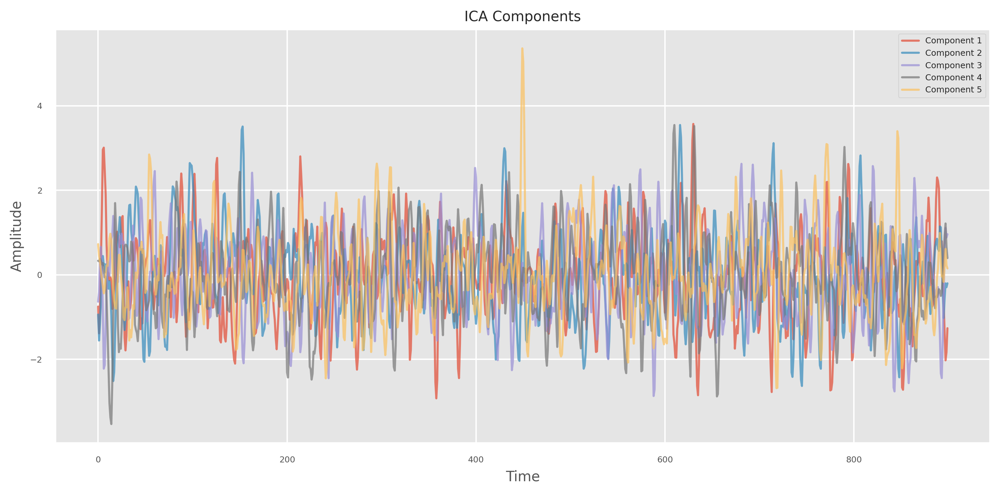

In [136]:
def plot_ICA_components(ica_features, n_components=5):
    """
    Plot the independent components obtained from ICA.
    """
    fig, axes = plt.subplots(1, 1, figsize=(10, 5), dpi=300)
    
    for i in range(n_components):
        axes.plot(ica_features[:, i], label=f'Component {i+1}', alpha=0.7)
        axes.set_title(f'ICA Components')
        axes.set_xlabel('Time')
        axes.set_ylabel('Amplitude')
        axes.legend()
    
    plt.tight_layout()
    plt.show()

plot_ICA_components(ica_features_pc, n_components=5)



In [121]:
def create_hierarchical_cluster_mapping(rates_per_neuron, clusters_pcON, clusters_pcOFF, neuronsON, neuronsOFF):
    """
    Create a unified mapping of all neurons to hierarchical cluster labels
    """
    n_total_neurons = rates_per_neuron.shape[0]
    
    # Initialize master array with default values
    neuron_cluster_labels = np.full(n_total_neurons, "unassigned", dtype=object)
    neuron_cluster_ids = np.full(n_total_neurons, -1, dtype=int)
    
    print(f"Total neurons to assign: {n_total_neurons}")
    print(f"ON neurons: {len(neuronsON)}")
    print(f"OFF neurons: {len(neuronsOFF)}")
    
    # Map ON-state subclusters
    on_clusters = clusters_pcON['clusters']
    on_neurons = clusters_pcON['neurons']
    
    for i, neuron_idx in enumerate(on_neurons):
        subcluster_id = on_clusters[i]
        hierarchical_label = f"ON_cluster_{subcluster_id}"
        neuron_cluster_labels[neuron_idx] = hierarchical_label
        neuron_cluster_ids[neuron_idx] = subcluster_id + 100  
    
    # Map OFF-state subclusters  
    off_clusters = clusters_pcOFF['clusters']
    off_neurons = clusters_pcOFF['neurons']
    
    for i, neuron_idx in enumerate(off_neurons):
        subcluster_id = off_clusters[i]
        hierarchical_label = f"OFF_cluster_{subcluster_id}"
        neuron_cluster_labels[neuron_idx] = hierarchical_label
        neuron_cluster_ids[neuron_idx] = subcluster_id + 200 
    
    unassigned_count = np.sum(neuron_cluster_labels == "unassigned")
    print(f"\nValidation Results:")
    print(f"Unassigned neurons: {unassigned_count}")
    print(f"Assigned neurons: {n_total_neurons - unassigned_count}")
    
    if unassigned_count > 0:
        unassigned_indices = np.where(neuron_cluster_labels == "unassigned")[0]
        print(f"WARNING: Unassigned neuron indices: {unassigned_indices}")
    
    unique_labels, counts = np.unique(neuron_cluster_labels, return_counts=True)
    print(f"\nCluster Distribution:")
    for label, count in zip(unique_labels, counts):
        print(f"  {label}: {count} neurons")
    
    cluster_to_neurons = {}
    neuron_to_cluster = {}
    
    for neuron_idx, label in enumerate(neuron_cluster_labels):
        if label != "unassigned":
            neuron_to_cluster[neuron_idx] = label

            if label not in cluster_to_neurons:
                cluster_to_neurons[label] = []
            cluster_to_neurons[label].append(neuron_idx)
    
    return {
        'neuron_cluster_labels': neuron_cluster_labels,
        'neuron_cluster_ids': neuron_cluster_ids,
        'cluster_to_neurons': cluster_to_neurons,
        'neuron_to_cluster': neuron_to_cluster,
        'summary_stats': dict(zip(unique_labels, counts))
    }

# Create the unified mapping
hierarchical_mapping = create_hierarchical_cluster_mapping(
    rates_per_neuronPC, 
    clusters_pcON, 
    clusters_pcOFF, 
    neuronsON, 
    neuronsOFF
)

Total neurons to assign: 68
ON neurons: 18
OFF neurons: 50

Validation Results:
Unassigned neurons: 0
Assigned neurons: 68

Cluster Distribution:
  OFF_cluster_0: 4 neurons
  OFF_cluster_1: 7 neurons
  OFF_cluster_2: 2 neurons
  OFF_cluster_3: 12 neurons
  OFF_cluster_4: 7 neurons
  OFF_cluster_5: 10 neurons
  OFF_cluster_6: 6 neurons
  OFF_cluster_7: 2 neurons
  ON_cluster_0: 3 neurons
  ON_cluster_1: 3 neurons
  ON_cluster_2: 2 neurons
  ON_cluster_3: 3 neurons
  ON_cluster_4: 2 neurons
  ON_cluster_5: 3 neurons
  ON_cluster_6: 2 neurons


In [261]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import geotorch

features_tensor_raw = torch.FloatTensor(rates_per_neuronPC)
print(f"Raw features tensor shape: {features_tensor_raw.shape}") 
dataset_raw = TensorDataset(features_tensor_raw, features_tensor_raw)
dataloader_raw = DataLoader(dataset_raw, batch_size=16, shuffle=True, drop_last=False)

Raw features tensor shape: torch.Size([68, 900])


In [ ]:
class Encoder(nn.Module):
    def __init__(self, input_size, dropout, latent_size=32):
        super(Encoder, self).__init__()
        self.input_size = input_size
        self.latent_size = latent_size
        self.dropout = dropout
        
        self.main_layer = nn.Linear(input_size, latent_size)
        self.dropout_layer = nn.Dropout(dropout)
        self.activation = nn.Tanh()

    def forward(self, x):
        x = self.main_layer(x)
        x = self.dropout_layer(x)
        x = self.activation(x)
        return x


class Decoder(nn.Module):
    def __init__(self, latent_size, output_size, dropout=0.1):
        super(Decoder, self).__init__()
        self.latent_size = latent_size
        self.output_size = output_size
        
        self.main_layer = nn.Linear(latent_size, output_size)
    
    def forward(self, x):
        x = self.main_layer(x)
        return x 

class OrthAutoencoder(nn.Module):
    def __init__(self, input_size, latent_size=8, dropout=0.1, 
                 lr=0.0001, weight_decay=1e-5):
        super(OrthAutoencoder, self).__init__()
        self.encoder = Encoder(input_size, dropout, latent_size)
        self.decoder = Decoder(latent_size, input_size, dropout)

        try:
            geotorch.orthogonal(self.encoder.main_layer, "weight")
            geotorch.orthogonal(self.decoder.main_layer, "weight")
        except KeyError:
            print("Orthogonal constraint already exists, skipping...")
        
        self.optim = optim.Adam(self.parameters(), lr=lr, weight_decay=weight_decay)
    
    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed, latent
    
    def encode(self, x):
        return self.encoder(x)
    
    def decode(self, latent):
        return self.decoder(latent)
    
    def recon_loss(self, output, target):
        recon_loss = torch.mean((output - target)**2)

        return recon_loss


In [254]:
rates_per_neuronPC.shape[1]

900

In [259]:
modelAE = OrthAutoencoder(
    input_size=rates_per_neuronPC.shape[1],
    latent_size=16,
    dropout=0.1,
    lr=0.001,
    weight_decay=1e-5
)

In [268]:
def train_autoencoder(model, dataloader, device, n_epochs=100):
    model.to(device)
    model.train()
    train_losses = []
    
    for epoch in range(n_epochs):
        epoch_losses = {'recon': 0}
        
        for batch_data, _ in dataloader:
            # print(f"Batch data shape: {batch_data.shape}")
            batch_data = batch_data.to(device)
            
            model.optim.zero_grad()
            reconstructed, latent = model(batch_data)
            
            total_loss = model.recon_loss(reconstructed, batch_data)
            
            total_loss.backward()
            model.optim.step()

            epoch_losses['recon'] += total_loss.item()
            

        # Average losses
        epoch_losses['recon'] /= len(dataloader)
        
        train_losses.append(epoch_losses)
        
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch + 1}/{n_epochs}], "
                  f"Reconstruction Loss: {epoch_losses['recon']:.4f}")
    
    return model, train_losses

In [269]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

model_sparseTrained, train_losses_sparse = train_autoencoder(
    modelAE, 
    dataloader_raw, 
    device  
)

cuda
Epoch [10/100], Reconstruction Loss: 2172.9272
Epoch [20/100], Reconstruction Loss: 2177.7072
Epoch [30/100], Reconstruction Loss: 2174.5385
Epoch [40/100], Reconstruction Loss: 2165.3130
Epoch [50/100], Reconstruction Loss: 2156.5472
Epoch [60/100], Reconstruction Loss: 2170.4250
Epoch [70/100], Reconstruction Loss: 2139.2283
Epoch [80/100], Reconstruction Loss: 2138.8596
Epoch [90/100], Reconstruction Loss: 2156.2984
Epoch [100/100], Reconstruction Loss: 2126.0569
